# Next Stop: Rail-Induced Displacement of Immigrant Communities?
## Arroyo Seco Collective
### By Erik Felix and Kevin Liu

With Measure R’s passage in 2008, and Measure M’s passage in 2016,  LA Metro has been heavily investing in light rail. Metro’s L Line is a prime example. Completed in 2009 and cross cutting through both immigrant communities and wealthy white communities, the L Line traverses a particularly diverse segment of Los Angeles County making it a prime candidate for study. <br>

<em>Research question</em>: did Metro’s construction of the L Line through Pasadena, Highland Park, Chinatown, Boyle Heights, and East Los Angeles have a measurable impact on exacerbating displacement of foreign-born households who lived near the station? Or, is the trend around the station similar to trends happening neighborhood-wide?
<br>
<br>
To do this, we use the 2011 and 2019 ACS survey and hone in on the datapoint, Year of Entry Foreign Born. We use this datapoint to follow foreign born population trends. The 2011 ACS asks if a foreign born resident entered the country before or after 2000. The 2019 ACS asks if a foreign born resident entered the country before or after 2010, which aligns closely with the 2009 opening of the L Line’s extension into Chinatown and East LA. Understanding if recent immigrants are havng a harder, similar, or easier time living in the census tracts in the station area provides insight into the potential effect the rail investment may have on immigrant communities. 

In [3]:
# Let's start by importing all of the libraries we'll need for our analyses

import pandas as pd

import geopandas as gpd

from shapely.geometry import Point

import contextily as ctx

import matplotlib.pyplot as plt

# for interactive plots
import plotly.express as px

# for network analysis
import networkx as nx

# for street network analysis
import osmnx as ox

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


We have four different data files that need merging, so the first section here is merging all our files into one geodataframe. We first merge the two geojson files (ACS 2019 data, table B01003 for Total Population, and Table B05007 for Foreign Born Residents), then merge the two .csv files (ACS 2011 data, same tables), and then merge the two dataframes to create one big data frame with both ACS 2019 an?d 2011 files in it.

In [4]:
# Importing ACS 2019 Total Pop

gdf1 = gpd.read_file('acs2019_5yr_B01003_14000US06037222001.geojson')

In [5]:
# Importing ACS 2019 Foreign Born

gdf2 = gpd.read_file('acs2019_5yr_B05007.geojson')

In [6]:
gdf1.head()

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US06037,"Los Angeles County, CA",10081570.0,0.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


In [7]:
gdf2.head()

,geoid,name,B05007001,"B05007001, Error",B05007002,"B05007002, Error",B05007003,"B05007003, Error",B05007004,"B05007004, Error",...,"B05007102, Error",B05007103,"B05007103, Error",B05007104,"B05007104, Error",B05007105,"B05007105, Error",B05007106,"B05007106, Error",geometry
0,05000US06037,"Los Angeles County, CA",3430535.0,14118.0,441555.0,6639.0,54213.0,1710.0,387342.0,6344.0,...,998.0,4753.0,625.0,36463.0,1209.0,29493.0,1166.0,6970.0,540.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,326.0,217.0,129.0,63.0,66.0,154.0,126.0,...,13.0,11.0,16.0,11.0,17.0,0.0,12.0,11.0,17.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,180.0,45.0,39.0,9.0,17.0,36.0,35.0,...,12.0,0.0,12.0,21.0,23.0,0.0,12.0,21.0,23.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,438.0,271.0,216.0,10.0,17.0,261.0,216.0,...,17.0,0.0,17.0,88.0,71.0,51.0,44.0,37.0,59.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,251.0,184.0,124.0,48.0,58.0,136.0,112.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


In [8]:
# Dropping our first rows because we don't need the totals for the entire county

gdf1 = gdf1.drop([0])

In [9]:
gdf2 = gdf2.drop([0])

In [10]:
gdf1.head()

,geoid,name,B01003001,"B01003001, Error",geometry
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,394.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [11]:
gdf2.head()

,geoid,name,B05007001,"B05007001, Error",B05007002,"B05007002, Error",B05007003,"B05007003, Error",B05007004,"B05007004, Error",...,"B05007102, Error",B05007103,"B05007103, Error",B05007104,"B05007104, Error",B05007105,"B05007105, Error",B05007106,"B05007106, Error",geometry
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,326.0,217.0,129.0,63.0,66.0,154.0,126.0,...,13.0,11.0,16.0,11.0,17.0,0.0,12.0,11.0,17.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,180.0,45.0,39.0,9.0,17.0,36.0,35.0,...,12.0,0.0,12.0,21.0,23.0,0.0,12.0,21.0,23.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,438.0,271.0,216.0,10.0,17.0,261.0,216.0,...,17.0,0.0,17.0,88.0,71.0,51.0,44.0,37.0,59.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,251.0,184.0,124.0,48.0,58.0,136.0,112.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",1658.0,261.0,192.0,164.0,11.0,17.0,181.0,164.0,...,35.0,0.0,12.0,56.0,52.0,56.0,52.0,0.0,12.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [12]:
# Merging our geodataframes via an attribute join, with our attribute being "geoid", which we'll later change to FIPS code

acs19 = gdf2.merge(gdf1,on = ['geoid'])

In [13]:
acs19.head()

,geoid,name_x,B05007001,"B05007001, Error",B05007002,"B05007002, Error",B05007003,"B05007003, Error",B05007004,"B05007004, Error",...,"B05007104, Error",B05007105,"B05007105, Error",B05007106,"B05007106, Error",geometry_x,name_y,B01003001,"B01003001, Error",geometry_y
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,326.0,217.0,129.0,63.0,66.0,154.0,126.0,...,17.0,0.0,12.0,11.0,17.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...","Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,180.0,45.0,39.0,9.0,17.0,36.0,35.0,...,23.0,0.0,12.0,21.0,23.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...","Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,438.0,271.0,216.0,10.0,17.0,261.0,216.0,...,71.0,51.0,44.0,37.0,59.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...","Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,251.0,184.0,124.0,48.0,58.0,136.0,112.0,...,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...","Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",1658.0,261.0,192.0,164.0,11.0,17.0,181.0,164.0,...,52.0,56.0,52.0,0.0,12.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...","Census Tract 1013, Los Angeles, CA",3884.0,394.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [14]:
# Keeping only the estimate, geoid, and geometry columns while dropping margin for error

acs19 = acs19[['geoid', 
               'name_x', 
               'B01003001', 
               'B05007001', 
               'B05007002', 
               'B05007014', 
               'B05007015',  
               'B05007027', 
               'B05007028', 
               'B05007040', 
               'B05007041', 
               'B05007042', 
               'B05007054', 
               'B05007055', 
               'B05007056',
               'B05007068', 
               'B05007069', 
               'B05007081', 
               'B05007082', 
               'B05007094', 
               'B05007095', 
               'geometry_y']
             ] 
               

In [15]:
acs19.head()

,geoid,name_x,B01003001,B05007001,B05007002,B05007014,B05007015,B05007027,B05007028,B05007040,...,B05007054,B05007055,B05007056,B05007068,B05007069,B05007081,B05007082,B05007094,B05007095,geometry_y
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,...,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,...,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,...,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,...,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,...,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [16]:
# Renaming columns based on the metadata

acs19.columns = ['FIPS', 
                 'Census Tract', 
                 '19 Total Population', 
                 '19 Total Foreign Born',
                 '19 Total Entered 2010 or later', 
                 '19 Europe', 
                 '19 Europe Entered 2010 or later', 
                 '19 Asia', 
                 '19 Asia Entered 2010 or later', 
                 '19 Latin America', 
                 '19 Caribbean', 
                 '19 Caribbean entered 2010 or later', 
                 '19 Central America', 
                 '19 Mexico', 
                 '19 Mexico Entered 2010 or later', 
                 '19 Other Central America', 
                 '19 Other Central America Entered 2010 or later', 
                 '19 South America', 
                 '19 South America Entered 2010 or later', 
                 '19 Other Areas', 
                 '19 Other Areas Entered 2010 or later', 
                 'Geometry']
                 

In [17]:
acs19.head()

,FIPS,Census Tract,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,...,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,Geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,...,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,...,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,...,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,...,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,...,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [18]:
# Turning our geoid's into FIPS codes

acs19['FIPS'] = acs19['FIPS'].str.replace('14000US','')

In [19]:
acs19.head()

,FIPS,Census Tract,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,...,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,Geometry
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,...,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,...,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,...,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,...,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,...,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


The 2011 files required a bit more work before merging, so there are definitely more steps involved below.

In [20]:
# Importing ACS 2011 Foreign Born

df1 = pd.read_csv('ACSDT5Y2011.B05007_data_with_overlays_2022-02-20T144252.csv')

In [21]:
# Importing ACS 2011 Total Pop

df2 = pd.read_csv('ACSDT5Y2011.B01003_data_with_overlays_2022-02-18T183522.csv')

In [22]:
df1.head()

,B05007_001E,B05007_001M,B05007_002E,B05007_002M,B05007_003E,B05007_003M,B05007_004E,B05007_004M,B05007_005E,B05007_005M,...,B05007_091E,B05007_091M,B05007_092E,B05007_092M,B05007_093E,B05007_093M,B05007_094E,B05007_094M,GEO_ID,NAME
0,Estimate!!Total,Margin of Error!!Total,Estimate!!Total!!Europe,Margin of Error!!Total!!Europe,Estimate!!Total!!Europe!!Entered 2000 or later,Margin of Error!!Total!!Europe!!Entered 2000 o...,Estimate!!Total!!Europe!!Entered 2000 or later...,Margin of Error!!Total!!Europe!!Entered 2000 o...,Estimate!!Total!!Europe!!Entered 2000 or later...,Margin of Error!!Total!!Europe!!Entered 2000 o...,...,Estimate!!Total!!Other areas!!Entered 1980 to ...,Margin of Error!!Total!!Other areas!!Entered 1...,Estimate!!Total!!Other areas!!Entered before 1980,Margin of Error!!Total!!Other areas!!Entered b...,Estimate!!Total!!Other areas!!Entered before 1...,Margin of Error!!Total!!Other areas!!Entered b...,Estimate!!Total!!Other areas!!Entered before 1...,Margin of Error!!Total!!Other areas!!Entered b...,id,Geographic Area Name
1,2027,394,93,56,15,17,7,10,8,13,...,0,95,0,95,0,95,0,95,1400000US06037101110,"Census Tract 1011.10, Los Angeles County, Cali..."
2,1254,318,144,80,0,95,0,95,0,95,...,0,95,9,14,0,95,9,14,1400000US06037101122,"Census Tract 1011.22, Los Angeles County, Cali..."
3,3471,547,39,40,0,95,0,95,0,95,...,0,95,0,95,0,95,0,95,1400000US06037101210,"Census Tract 1012.10, Los Angeles County, Cali..."
4,1242,243,61,54,0,95,0,95,0,95,...,0,95,0,95,0,95,0,95,1400000US06037101220,"Census Tract 1012.20, Los Angeles County, Cali..."


In [23]:
# Keeping Estimates and geoid only

ctk = ['B05007_001E', 
       'B05007_002E',
       'B05007_003E', 
       'B05007_015E', 
       'B05007_016E', 
       'B05007_028E', 
       'B05007_029E', 
       'B05007_030E', 
       'B05007_042E', 
       'B05007_043E', 
       'B05007_044E', 
       'B05007_056E', 
       'B05007_057E', 
       'B05007_069E', 
       'B05007_070E', 
       'B05007_082E', 
       'B05007_083E', 
       'GEO_ID'
        ]

In [24]:
df1 = df1[ctk]

In [25]:
df1.head()

,B05007_001E,B05007_002E,B05007_003E,B05007_015E,B05007_016E,B05007_028E,B05007_029E,B05007_030E,B05007_042E,B05007_043E,B05007_044E,B05007_056E,B05007_057E,B05007_069E,B05007_070E,B05007_082E,B05007_083E,GEO_ID
0,Estimate!!Total,Estimate!!Total!!Europe,Estimate!!Total!!Europe!!Entered 2000 or later,Estimate!!Total!!Asia,Estimate!!Total!!Asia!!Entered 2000 or later,Estimate!!Total!!Latin America,Estimate!!Total!!Latin America!!Caribbean,Estimate!!Total!!Latin America!!Caribbean!!Ent...,Estimate!!Total!!Latin America!!Central America,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!South America,Estimate!!Total!!Latin America!!South America!...,Estimate!!Total!!Other areas,Estimate!!Total!!Other areas!!Entered 2000 or ...,id
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,1400000US06037101110
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,1400000US06037101122
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,1400000US06037101210
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,1400000US06037101220


In [26]:
# Renaming according to metadata

df1.columns = ['11 Total Foreign Born', 
               '11 Total Europe', 
               '11 Total Europe Entered 2000 or later', 
               '11 Total Asia', 
               '11 Total Asia Entered 2000 or later', 
               '11 Total Latin America', 
               '11 Total Caribbean', 
               '11 Total Caribbean Entered 2000 or later', 
               '11 Total Central America',  
               '11 Total Mexico', 
               '11 Total Mexico Entered 2000 or later', 
               '11 Total Other Central America', 
               '11 Total Other Central America 2000 or later', 
               '11 Total South America', 
               '11 Total South America Entered 2000 or later', 
               '11 Total Other areas', 
               '11 Total Other areas Entered 2000 or later', 
               'FIPS']

In [27]:
df1.head()

,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS
0,Estimate!!Total,Estimate!!Total!!Europe,Estimate!!Total!!Europe!!Entered 2000 or later,Estimate!!Total!!Asia,Estimate!!Total!!Asia!!Entered 2000 or later,Estimate!!Total!!Latin America,Estimate!!Total!!Latin America!!Caribbean,Estimate!!Total!!Latin America!!Caribbean!!Ent...,Estimate!!Total!!Latin America!!Central America,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!Central Americ...,Estimate!!Total!!Latin America!!South America,Estimate!!Total!!Latin America!!South America!...,Estimate!!Total!!Other areas,Estimate!!Total!!Other areas!!Entered 2000 or ...,id
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,1400000US06037101110
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,1400000US06037101122
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,1400000US06037101210
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,1400000US06037101220


In [28]:
# Dropping county totals

df1 = df1.drop([0])

In [29]:
df1.head()

,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,1400000US06037101110
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,1400000US06037101122
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,1400000US06037101210
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,1400000US06037101220
5,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,1400000US06037101300


In [30]:
df1['FIPS'] = df1['FIPS'].str.replace('1400000US','')

In [31]:
df1.head()

,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,06037101110
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,06037101122
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,06037101210
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,06037101220
5,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,06037101300


In [32]:
# Creating a sum column for Entered 2000 or later, like the one that exists in our ACS dataframez

column_list = list(df1)

In [33]:
print(column_list)

['11 Total Foreign Born', '11 Total Europe', '11 Total Europe Entered 2000 or later', '11 Total Asia', '11 Total Asia Entered 2000 or later', '11 Total Latin America', '11 Total Caribbean', '11 Total Caribbean Entered 2000 or later', '11 Total Central America', '11 Total Mexico', '11 Total Mexico Entered 2000 or later', '11 Total Other Central America', '11 Total Other Central America 2000 or later', '11 Total South America', '11 Total South America Entered 2000 or later', '11 Total Other areas', '11 Total Other areas Entered 2000 or later', 'FIPS']


In [34]:
column_list = ['11 Total Europe Entered 2000 or later', '11 Total Asia Entered 2000 or later', '11 Total Caribbean Entered 2000 or later', '11 Total Mexico Entered 2000 or later', '11 Total Other Central America 2000 or later', '11 Total South America Entered 2000 or later', '11 Total Other areas Entered 2000 or later']

In [35]:
print(column_list)

['11 Total Europe Entered 2000 or later', '11 Total Asia Entered 2000 or later', '11 Total Caribbean Entered 2000 or later', '11 Total Mexico Entered 2000 or later', '11 Total Other Central America 2000 or later', '11 Total South America Entered 2000 or later', '11 Total Other areas Entered 2000 or later']


In [36]:
df1["sum"] = df1[column_list].sum(axis=1)

In [37]:
df1.head()

,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS,sum
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,06037101110,1.530304e+11
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,06037101122,8.700000e+06
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,06037101210,5.610655e+11
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,06037101220,9.807801e+08
5,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,06037101300,1.410000e+08


In [38]:
# Renaming sum column

df1 = df1.rename(columns={'sum': '11 Total Entered 2000 or later'})

In [39]:
df1.head()

,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS,11 Total Entered 2000 or later
1,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,06037101110,1.530304e+11
2,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,06037101122,8.700000e+06
3,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,06037101210,5.610655e+11
4,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,06037101220,9.807801e+08
5,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,06037101300,1.410000e+08


In [40]:
# Reordering our columns

df1 = df1[['11 Total Foreign Born', 
           '11 Total Entered 2000 or later', 
           '11 Total Europe', 
           '11 Total Europe Entered 2000 or later', 
           '11 Total Asia', '11 Total Asia Entered 2000 or later', 
           '11 Total Latin America', '11 Total Caribbean', 
           '11 Total Caribbean Entered 2000 or later', 
           '11 Total Central America', '11 Total Mexico', 
           '11 Total Mexico Entered 2000 or later', 
           '11 Total Other Central America', 
           '11 Total Other Central America 2000 or later', 
           '11 Total South America', 
           '11 Total South America Entered 2000 or later', 
           '11 Total Other areas', 
           '11 Total Other areas Entered 2000 or later', 
           'FIPS']]

In [41]:
df1.head()

,11 Total Foreign Born,11 Total Entered 2000 or later,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS
1,2027,1.530304e+11,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,06037101110
2,1254,8.700000e+06,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,06037101122
3,3471,5.610655e+11,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,06037101210
4,1242,9.807801e+08,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,06037101220
5,1374,1.410000e+08,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,06037101300


In [42]:
# Moving on to our total pop file

df2.head()

,B01003_001E,B01003_001M,GEO_ID,NAME
0,Estimate!!Total,Margin of Error!!Total,id,Geographic Area Name
1,5012,424,1400000US06037101110,"Census Tract 1011.10, Los Angeles County, Cali..."
2,3584,388,1400000US06037101122,"Census Tract 1011.22, Los Angeles County, Cali..."
3,6529,533,1400000US06037101210,"Census Tract 1012.10, Los Angeles County, Cali..."
4,2751,319,1400000US06037101220,"Census Tract 1012.20, Los Angeles County, Cali..."


In [43]:
# Just keeping total pop and geoid

ctk2 = ['B01003_001E', 
        'GEO_ID']

In [44]:
df2 = df2[ctk2]

In [45]:
df2.head()

,B01003_001E,GEO_ID
0,Estimate!!Total,id
1,5012,1400000US06037101110
2,3584,1400000US06037101122
3,6529,1400000US06037101210
4,2751,1400000US06037101220


In [46]:
# Renaming

df2.columns = ['11 Total Population', 
               'FIPS']

In [47]:
# Dropping total

df2 = df2.drop([0])

In [48]:
df2.head()

,11 Total Population,FIPS
1,5012,1400000US06037101110
2,3584,1400000US06037101122
3,6529,1400000US06037101210
4,2751,1400000US06037101220
5,4123,1400000US06037101300


In [49]:
# geoid -- FIPS, for some reason this file's geoid had more zeroes!

df2['FIPS'] = df2['FIPS'].str.replace('1400000US','')

In [50]:
df2.head()

,11 Total Population,FIPS
1,5012,06037101110
2,3584,06037101122
3,6529,06037101210
4,2751,06037101220
5,4123,06037101300


In [51]:
# Attribute join

acs11 = df1.merge(df2, on='FIPS')

In [52]:
acs11

,11 Total Foreign Born,11 Total Entered 2000 or later,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,FIPS,11 Total Population
0,2027,1.530304e+11,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,06037101110,5012
1,1254,8.700000e+06,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,06037101122,3584
2,3471,5.610655e+11,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,06037101210,6529
3,1242,9.807801e+08,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,06037101220,2751
4,1374,1.410000e+08,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,06037101300,4123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2341,209,8.000000e+03,9,0,25,0,159,0,0,159,151,8,8,0,0,0,16,0,06037980031,1017
2342,0,0.000000e+00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,06037980033,4
2343,0,0.000000e+00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,06037990100,0
2344,0,0.000000e+00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,06037990200,0


In [53]:
# The Grand Join! Attribute joining the ACS 2019 and ACS 2011

merged = acs19.merge(acs11, on='FIPS')

In [54]:
merged.head()

,FIPS,Census Tract,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,...,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,11 Total Population
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,...,412,137,42,275,55,37,8,18,9,5012
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,...,46,34,0,12,0,12,0,18,0,3584
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,...,1420,710,65,710,512,38,0,55,30,6529
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,...,419,313,78,106,0,8,0,71,71,2751
4,06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,...,22,22,0,0,0,40,0,47,15,4123


In [55]:
# Rearranging columns

merged = merged[['FIPS', 
        'Census Tract', 
        '11 Total Population', 
        '11 Total Foreign Born', 
        '11 Total Europe', 
        '11 Total Europe Entered 2000 or later', 
        '11 Total Asia', 
        '11 Total Asia Entered 2000 or later', 
        '11 Total Latin America', 
        '11 Total Caribbean', 
        '11 Total Caribbean Entered 2000 or later', 
        '11 Total Central America',  
        '11 Total Mexico', 
        '11 Total Mexico Entered 2000 or later', 
        '11 Total Other Central America', 
        '11 Total Other Central America 2000 or later', 
        '11 Total South America', 
        '11 Total South America Entered 2000 or later', 
        '11 Total Other areas', 
        '11 Total Other areas Entered 2000 or later', 
        '19 Total Population', 
        '19 Total Foreign Born',
        '19 Total Entered 2010 or later', 
        '19 Europe', 
        '19 Europe Entered 2010 or later', 
        '19 Asia', 
        '19 Asia Entered 2010 or later', 
        '19 Latin America', 
        '19 Caribbean', 
        '19 Caribbean entered 2010 or later', 
        '19 Central America', 
        '19 Mexico', 
        '19 Mexico Entered 2010 or later', 
        '19 Other Central America', 
        '19 Other Central America Entered 2010 or later', 
        '19 South America', 
        '19 South America Entered 2010 or later', 
        '19 Other Areas', 
        '19 Other Areas Entered 2010 or later', 
        'Geometry']]

In [56]:
# Wanted to be able to see all our columns

pd.set_option('display.max_columns', None)

In [57]:
merged.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Europe,11 Total Europe Entered 2000 or later,11 Total Asia,11 Total Asia Entered 2000 or later,11 Total Latin America,11 Total Caribbean,11 Total Caribbean Entered 2000 or later,11 Total Central America,11 Total Mexico,11 Total Mexico Entered 2000 or later,11 Total Other Central America,11 Total Other Central America 2000 or later,11 Total South America,11 Total South America Entered 2000 or later,11 Total Other areas,11 Total Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,Geometry
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [58]:
# Creating consistent naming

merged.columns = ['FIPS', 
                  'Census Tract', 
                  '11 Total Population', 
                  '11 Total Foreign Born', 
                  '11 Europe', 
                  '11 Europe Entered 2000 or later', 
                  '11 Asia', 
                  '11 Asia Entered 2000 or later', 
                  '11 Latin America', 
                  '11 Caribbean', 
                  '11 Caribbean Entered 2000 or later', 
                  '11 Central America', 
                  '11 Mexico',
                  '11 Mexico Entered 2000 or later', 
                  '11 Other Central America', 
                  '11 Other Central America 2000 or later', 
                  '11 South America', 
                  '11 South America Entered 2000 or later', 
                  '11 Other areas', 
                  '11 Other areas Entered 2000 or later', 
                  '19 Total Population', 
                  '19 Total Foreign Born', 
                  '19 Total Entered 2010 or later', 
                  '19 Europe', 
                  '19 Europe Entered 2010 or later', 
                  '19 Asia', 
                  '19 Asia Entered 2010 or later', 
                  '19 Latin America', 
                  '19 Caribbean', 
                  '19 Caribbean entered 2010 or later', 
                  '19 Central America', 
                  '19 Mexico', 
                  '19 Mexico Entered 2010 or later', 
                  '19 Other Central America', 
                  '19 Other Central America Entered 2010 or later', 
                  '19 South America', 
                  '19 South America Entered 2010 or later', 
                  '19 Other Areas', 
                  '19 Other Areas Entered 2010 or later', 
                  'geometry']

In [59]:
merged.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012,2027,93,15,1467,303,449,0,0,412,137,42,275,55,37,8,18,9,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584,1254,144,0,1026,87,66,8,0,46,34,0,12,0,12,0,18,0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529,3471,39,0,1919,561,1458,0,0,1420,710,65,710,512,38,0,55,30,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751,1242,61,0,673,98,437,10,0,419,313,78,106,0,8,0,71,71,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123,1374,97,0,1168,141,62,0,0,22,22,0,0,0,40,0,47,15,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [60]:
# Our 2011 data is all objects, whereas we want floats for the pop counts

merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2345 entries, 0 to 2344
Data columns (total 40 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   FIPS                                            2345 non-null   object  
 1   Census Tract                                    2345 non-null   object  
 2   11 Total Population                             2345 non-null   object  
 3   11 Total Foreign Born                           2345 non-null   object  
 4   11 Europe                                       2345 non-null   object  
 5   11 Europe Entered 2000 or later                 2345 non-null   object  
 6   11 Asia                                         2345 non-null   object  
 7   11 Asia Entered 2000 or later                   2345 non-null   object  
 8   11 Latin America                                2345 non-null   object  
 9   11 Caribbean                  

In [61]:
 # Convering our pop counts to floats
    
 merged['11 Total Population'] =  merged['11 Total Population'].astype(float)
 merged['11 Total Foreign Born'] = merged ['11 Total Foreign Born'].astype(float)                                
 merged['11 Europe'] = merged['11 Europe'].astype(float)                                           
 merged['11 Europe Entered 2000 or later'] = merged['11 Europe Entered 2000 or later'].astype(float)                     
 merged['11 Asia'] =  merged['11 Asia'].astype(float)                                            
 merged['11 Asia Entered 2000 or later'] = merged['11 Asia Entered 2000 or later'].astype(float)                        
 merged['11 Latin America'] =  merged['11 Latin America'].astype(float)                                    
 merged['11 Caribbean'] = merged['11 Caribbean'].astype(float)                                        
 merged['11 Caribbean Entered 2000 or later'] = merged['11 Caribbean Entered 2000 or later'].astype(float)                  
 merged['11 Central America'] = merged['11 Central America'].astype(float)                                  
 merged['11 Mexico'] = merged['11 Mexico'].astype(float)                                           
 merged['11 Mexico Entered 2000 or later'] = merged['11 Mexico Entered 2000 or later'].astype(float)                     
 merged['11 Other Central America'] = merged['11 Other Central America'].astype(float)                            
 merged['11 Other Central America 2000 or later'] = merged['11 Other Central America 2000 or later'].astype(float)              
 merged['11 South America'] = merged['11 South America'].astype(float)                                    
 merged['11 South America Entered 2000 or later'] = merged['11 South America Entered 2000 or later'].astype(float)              
 merged['11 Other areas'] = merged['11 Other areas'].astype(float)
 merged['11 Other areas Entered 2000 or later'] = merged['11 Other areas Entered 2000 or later'].astype(float)        


In [62]:
# Success!

merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2345 entries, 0 to 2344
Data columns (total 40 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   FIPS                                            2345 non-null   object  
 1   Census Tract                                    2345 non-null   object  
 2   11 Total Population                             2345 non-null   float64 
 3   11 Total Foreign Born                           2345 non-null   float64 
 4   11 Europe                                       2345 non-null   float64 
 5   11 Europe Entered 2000 or later                 2345 non-null   float64 
 6   11 Asia                                         2345 non-null   float64 
 7   11 Asia Entered 2000 or later                   2345 non-null   float64 
 8   11 Latin America                                2345 non-null   float64 
 9   11 Caribbean                  

In [63]:
# Our research q is concerned with % change, so we create a column for that

merged['% Change Foreign Born'] = (merged['19 Total Foreign Born']/merged['19 Total Population'] - merged['11 Total Foreign Born']/merged['11 Total Population']) * 100

In [64]:
merged.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012.0,2027.0,93.0,15.0,1467.0,303.0,449.0,0.0,0.0,412.0,137.0,42.0,275.0,55.0,37.0,8.0,18.0,9.0,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",-7.195213
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584.0,1254.0,144.0,0.0,1026.0,87.0,66.0,8.0,0.0,46.0,34.0,0.0,12.0,0.0,12.0,0.0,18.0,0.0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",-11.200293
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529.0,3471.0,39.0,0.0,1919.0,561.0,1458.0,0.0,0.0,1420.0,710.0,65.0,710.0,512.0,38.0,0.0,55.0,30.0,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",-3.265223
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751.0,1242.0,61.0,0.0,673.0,98.0,437.0,10.0,0.0,419.0,313.0,78.0,106.0,0.0,8.0,0.0,71.0,71.0,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.097513
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123.0,1374.0,97.0,0.0,1168.0,141.0,62.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,40.0,0.0,47.0,15.0,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",9.362702


In [65]:
# Checking to see if our merge resulted in a geodataframe

type(merged)

pandas.core.frame.DataFrame

In [66]:
# Converting to a geodataframe

merged = gpd.GeoDataFrame(merged)

In [67]:
# Checking again

type(merged)

geopandas.geodataframe.GeoDataFrame

In [68]:
merged.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012.0,2027.0,93.0,15.0,1467.0,303.0,449.0,0.0,0.0,412.0,137.0,42.0,275.0,55.0,37.0,8.0,18.0,9.0,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",-7.195213
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584.0,1254.0,144.0,0.0,1026.0,87.0,66.0,8.0,0.0,46.0,34.0,0.0,12.0,0.0,12.0,0.0,18.0,0.0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",-11.200293
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529.0,3471.0,39.0,0.0,1919.0,561.0,1458.0,0.0,0.0,1420.0,710.0,65.0,710.0,512.0,38.0,0.0,55.0,30.0,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",-3.265223
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751.0,1242.0,61.0,0.0,673.0,98.0,437.0,10.0,0.0,419.0,313.0,78.0,106.0,0.0,8.0,0.0,71.0,71.0,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.097513
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123.0,1374.0,97.0,0.0,1168.0,141.0,62.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,40.0,0.0,47.0,15.0,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",9.362702


In [69]:
merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2345 entries, 0 to 2344
Data columns (total 41 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   FIPS                                            2345 non-null   object  
 1   Census Tract                                    2345 non-null   object  
 2   11 Total Population                             2345 non-null   float64 
 3   11 Total Foreign Born                           2345 non-null   float64 
 4   11 Europe                                       2345 non-null   float64 
 5   11 Europe Entered 2000 or later                 2345 non-null   float64 
 6   11 Asia                                         2345 non-null   float64 
 7   11 Asia Entered 2000 or later                   2345 non-null   float64 
 8   11 Latin America                                2345 non-null   float64 
 9   11 Caribbean          

In [70]:
# Creating a new variable so we can always reference back to our merged table if needed

gdf = merged

Now that we've got our two tables merged and our columns titled, let's move on to creating some maps.

### Percentage of Foreign Born Population in Metro L Line Del Mar Station Walkshed

Using 2019 ACS 5 Year data, we will be creating a chorpleth map of the census tracts showing the percentage of foreign born populations within a 10 minute walk from the Del Mar Station. We will overlay this data with a isochrone map of the walkshed (10 minute walking distance) around Del Mar Station.

In [71]:
# Let's start by orienting ourselves around the Del Mar Station by calling for it by address in osmnx

address = 'Del Mar, South Raymond Avenue, Old Pasadena, Pasadena, Los Angeles County, California, 91105, United States'
network_type = 'walk'
trip_times = [10] #in minutes
meters_per_minute = 80 # travel distance per minute

In [72]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# download the street network
G = ox.graph_from_address(address, network_type=network_type, dist = 1500)

CPU times: user 3.54 s, sys: 28.4 ms, total: 3.57 s
Wall time: 3.59 s


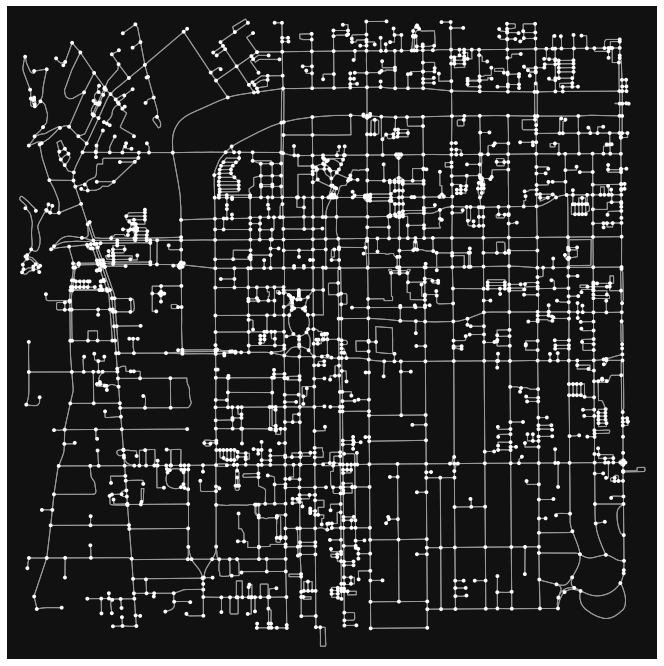

In [73]:
fig, ax = ox.plot_graph(G,figsize=(12,12))

In [74]:
G = ox.project_graph(G, to_crs='epsg:3857')

In [75]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [76]:
gdf_nodes.head()

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
14963716,4.049279e+06,-1.315043e+07,traffic_signals,4,-118.132316,34.152361,POINT (-13150429.308 4049278.739)
6784510760,4.049278e+06,-1.315040e+07,NaN,3,-118.132087,34.152358,POINT (-13150403.793 4049278.403)
3892769467,4.049279e+06,-1.315045e+07,traffic_signals,4,-118.132468,34.152362,POINT (-13150446.139 4049278.941)
1995207967,4.049204e+06,-1.315043e+07,NaN,4,-118.132311,34.151805,POINT (-13150428.729 4049204.015)
6784510757,4.049306e+06,-1.315043e+07,NaN,3,-118.132316,34.152564,POINT (-13150429.308 4049306.141)


<AxesSubplot:>

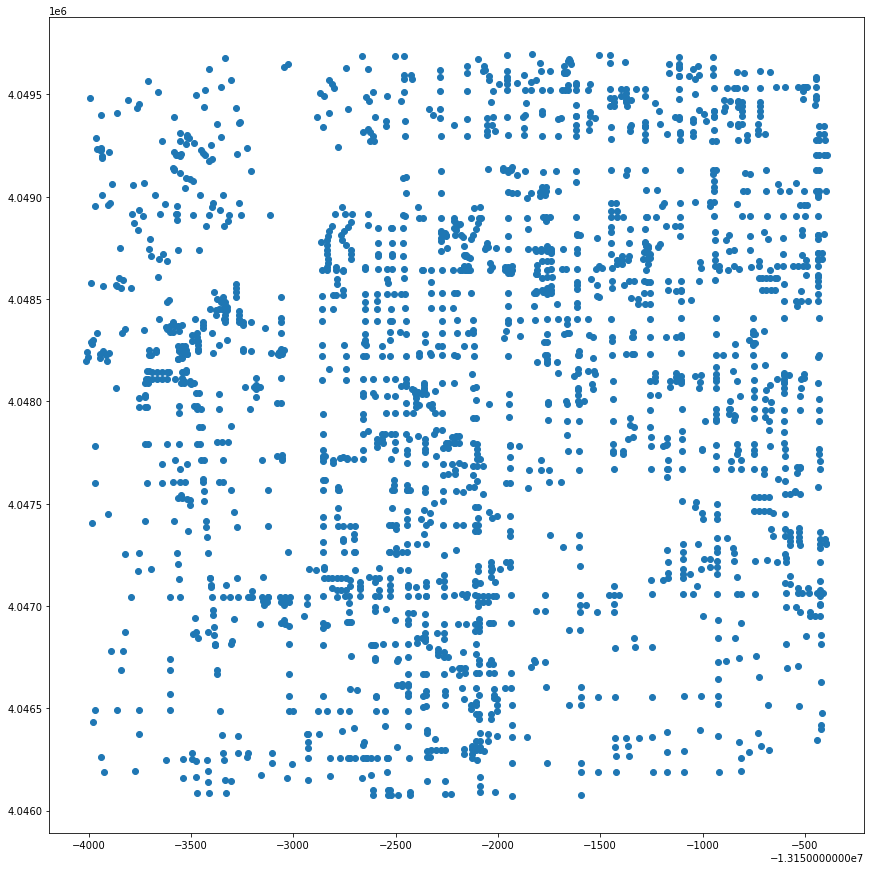

In [77]:
gdf_nodes.plot(figsize=(15,15))

In [78]:
gdf_edges.head()

osmid  oneway               name  \
u          v          key                                                      
14963716   6784510760 0                 405328940   False       Maple Street   
           3892769467 0                 607802969   False       Maple Street   
           1995207967 0    [173415946, 173415947]   False  North Lake Avenue   
           6784510757 0                 385937988   False  North Lake Avenue   
6784510760 14963716   0                 405328940   False       Maple Street   

                             highway  length  \
u          v          key                      
14963716   6784510760 0      primary  21.093   
           3892769467 0      primary  13.914   
           1995207967 0    secondary  61.772   
           6784510757 0    secondary  22.659   
6784510760 14963716   0      primary  21.093   

                                                                    geometry  \
u          v          key                                                      
14963716   6784510760 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           3892769467 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           1995207967 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           6784510757 0    LINESTRING (-13150429.308 4049278.739, -131504...   
6784510760 14963716   0    LINESTRING (-13150403.793 4049278.403, -131504...   

                          maxspeed bridge lanes access service  ref tunnel  \
u          v          key                                                    
14963716   6784510760 0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   
           3892769467 0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   
           1995207967 0     35 mph    yes   NaN    NaN     NaN  NaN    NaN   
           6784510757 0     35 mph    NaN   NaN    NaN     NaN  NaN    NaN   
6784510760 14963716   0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   

                          width  
u          v          key        
14963716   6784510760 0     NaN  
           3892769467 0     NaN  
           1995207967 0     NaN  
           6784510757 0     NaN  
6784510760 14963716   0     NaN

<AxesSubplot:>

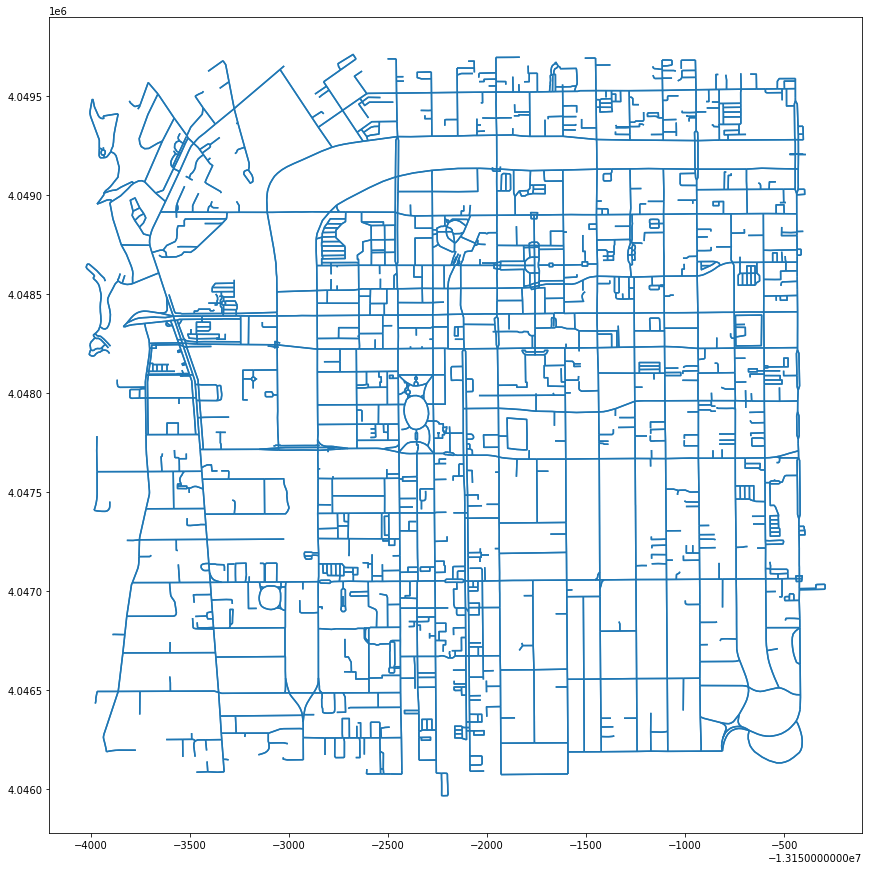

In [79]:
gdf_edges.plot(figsize=(15,15))

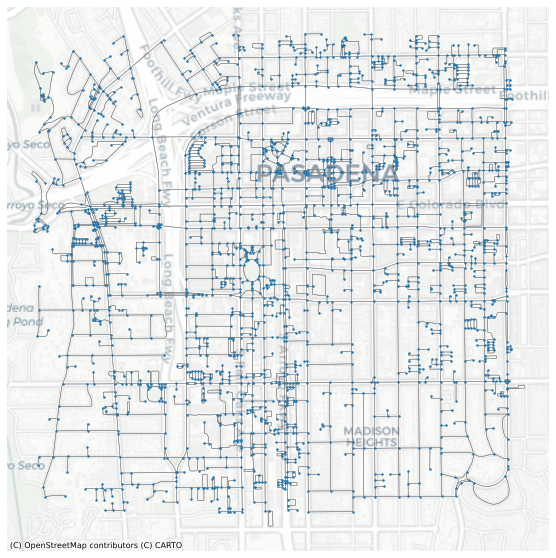

In [80]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)


# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [81]:
# get the bounding box coordinates
minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds
print(minx)
print(miny)
print(maxx)
print(maxy)

-13154010.901174664
4046072.998110596
-13150391.069632793
4049695.185661036


In [82]:
# calculate the centroid
centroid_x = (maxx-minx)/2 + minx
centroid_y = (maxy-miny)/2 + miny
print(centroid_x)
print(centroid_y)

-13152200.985403728
4047884.0918858163


In [83]:
# use osmnx's distance.nearest_nodes command to get the id for the nearest node
center_node = ox.distance.nearest_nodes(G,Y=centroid_y,X=centroid_x)
print('The id for the nearest node is ' + str(center_node))

The id for the nearest node is 1995241213


In [84]:
# what is this record?
gdf_nodes.loc[[center_node]]

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
1995241213,4.047831e+06,-1.315221e+07,NaN,1,-118.148271,34.141596,POINT (-13152205.321 4047830.780)


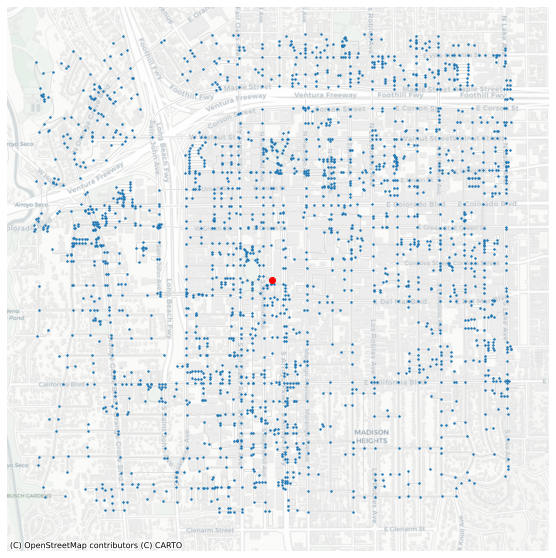

In [85]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gainsboro', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)

# add the center node in red also to ax
gdf_nodes.loc[[center_node]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [86]:
gdf_edges.sample(5)

,,,osmid,oneway,name,highway,length,geometry,maxspeed,bridge,lanes,access,service,ref,tunnel,width
u,v,key,,,,,,,,,,,,,,
6817163356,6817163357,0,727439928,False,NaN,service,71.607,"LINESTRING (-13152344.281 4046145.321, -131522...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6071486724,6071486722,0,646068942,False,NaN,service,62.749,"LINESTRING (-13152167.172 4046546.550, -131521...",NaN,NaN,NaN,NaN,parking_aisle,NaN,NaN,NaN
6822494099,6822494100,0,728045142,False,NaN,service,53.385,"LINESTRING (-13152609.500 4048043.144, -131526...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8692603176,7249382731,0,938291154,False,NaN,service,64.380,"LINESTRING (-13151876.539 4049389.528, -131519...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1446791933,1446791877,0,166979337,False,Grand Avenue,residential,33.419,"LINESTRING (-13153713.411 4048148.998, -131537...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
gdf_edges['walk_time'] = (gdf_edges['length']/meters_per_minute)

In [88]:
gdf_edges.sample(5)

,,,osmid,oneway,name,highway,length,geometry,maxspeed,bridge,lanes,access,service,ref,tunnel,width,walk_time
u,v,key,,,,,,,,,,,,,,,
1446792063,5321222762,0,131467712,False,NaN,footway,19.023,"LINESTRING (-13153622.274 4048361.933, -131536...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.237787
8692917525,8692917526,0,938320079,False,NaN,service,46.418,"LINESTRING (-13151389.461 4048900.389, -131513...",NaN,NaN,NaN,customers,NaN,NaN,NaN,NaN,0.580225
8474218929,6726656548,0,13382150,False,Market Alley,service,17.120,"LINESTRING (-13150540.950 4048490.172, -131505...",NaN,NaN,NaN,NaN,alley,NaN,NaN,NaN,0.214000
1927962653,280556291,0,405356616,False,East Del Mar Boulevard,secondary,38.635,"LINESTRING (-13152268.595 4047694.451, -131522...",35 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.482937
3695799670,3695799672,0,365580726,False,NaN,service,14.935,"LINESTRING (-13152496.299 4047263.189, -131524...",NaN,NaN,NaN,NaN,parking_aisle,NaN,NaN,NaN,0.186688


In [89]:
# assign a color hex code for each trip time isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap='plasma', 
                                start=0, 
                                return_hex=True)
print(trip_times)
print(iso_colors)

[10]
['#0d0887']


In [90]:
time_color = list(zip(trip_times, iso_colors))
time_color

[(10, '#0d0887')]

In [91]:
for time, color in list(time_color):

    # for each trip time, create an egograph of nodes that fall within that distance
    subgraph = nx.ego_graph(G, 1995241213, radius=time)

    print('There are ' + str(len(subgraph.nodes())) + ' nodes within ' + str(time) + ' minutes ')
    
    # for each of those nodes, update the gdf_nodes dataframe and assign it with its associated distance color
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = str(time) + ' mins'
        gdf_nodes.loc[node,'color'] = color

There are 179 nodes within 10 minutes 


In [92]:
gdf_nodes.sample(30)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
6735902722,4.046601e+06,-1.315211e+07,NaN,3,-118.147394,34.132453,POINT (-13152107.694 4046601.111),NaN,NaN
6726368358,4.049382e+06,-1.315169e+07,NaN,1,-118.143659,34.153131,POINT (-13151692.016 4049382.305),NaN,NaN
6726409483,4.048974e+06,-1.315094e+07,NaN,3,-118.136923,34.150094,POINT (-13150942.146 4048973.873),NaN,NaN
3053017476,4.049120e+06,-1.315195e+07,crossing,4,-118.145995,34.151177,POINT (-13151952.058 4049119.512),NaN,NaN
5549289846,4.047078e+06,-1.315276e+07,NaN,3,-118.153293,34.135998,POINT (-13152764.401 4047077.913),NaN,NaN
6352850329,4.046076e+06,-1.315254e+07,NaN,3,-118.151266,34.128550,POINT (-13152538.757 4046076.279),NaN,NaN
9000205682,4.046997e+06,-1.315260e+07,NaN,3,-118.151820,34.135398,POINT (-13152600.383 4046997.218),NaN,NaN
647076593,4.047839e+06,-1.315231e+07,NaN,3,-118.149242,34.141660,POINT (-13152313.435 4047839.428),10 mins,#0d0887
6728829235,4.047136e+06,-1.315328e+07,NaN,1,-118.157889,34.136433,POINT (-13153276.059 4047136.336),NaN,NaN


In [93]:
gdf_nodes['color'].fillna('#cccccc', inplace=True)

In [94]:
gdf_nodes.sample(5)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
6822446855,4.049353e+06,-1.315121e+07,NaN,1,-118.139318,34.152914,POINT (-13151208.734 4049353.141),NaN,#cccccc
123359157,4.048526e+06,-1.315251e+07,NaN,3,-118.150984,34.146761,POINT (-13152507.398 4048525.535),NaN,#cccccc
3769096081,4.046610e+06,-1.315247e+07,NaN,3,-118.150640,34.132517,POINT (-13152469.082 4046609.772),NaN,#cccccc
6726417411,4.049027e+06,-1.315078e+07,NaN,3,-118.135499,34.150491,POINT (-13150783.560 4049027.275),NaN,#cccccc
4989832427,4.048345e+06,-1.315196e+07,NaN,3,-118.146081,34.145420,POINT (-13151961.576 4048345.174),10 mins,#0d0887


<AxesSubplot:>

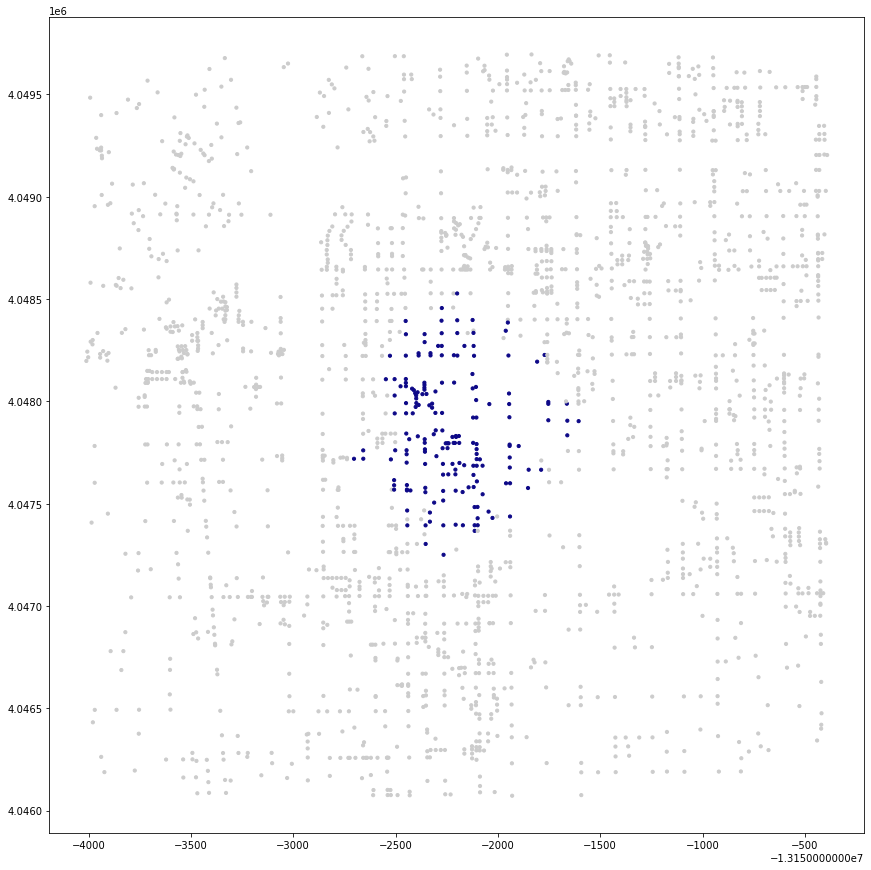

In [95]:
#plotting and taking a look at my nodes within the walkshed
gdf_nodes.plot(figsize=(15,15),
               color=gdf_nodes['color'],
               markersize=10)

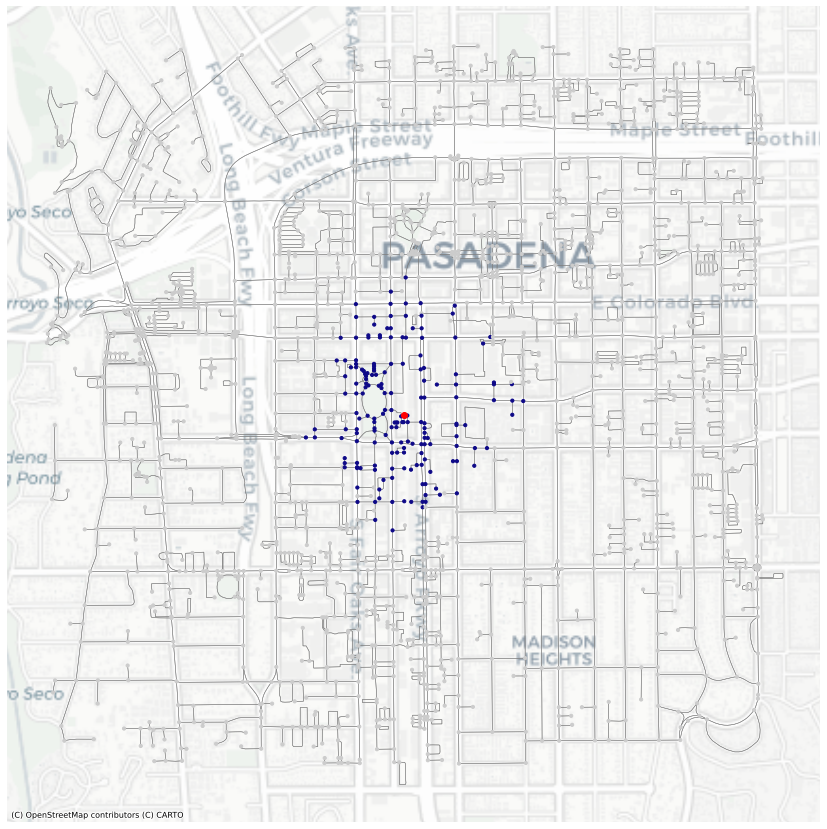

In [96]:
# a "full" map
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(15,15))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax,
               color=gdf_nodes['color'],
               markersize=10, 
               zorder=20)

# marking the station site with a red dot. Grabbed the station's node from OpenStreet Maps
gdf_nodes.loc[[1995241213]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [97]:
gdf_nodes[gdf_nodes['time']=='10 mins']

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
16218739,4.048393e+06,-1.315245e+07,traffic_signals,4,-118.150475,34.145775,POINT (-13152450.736 4048392.897),10 mins,#0d0887
122575436,4.048394e+06,-1.315228e+07,traffic_signals,4,-118.148901,34.145787,POINT (-13152275.453 4048394.443),10 mins,#0d0887
122615775,4.048328e+06,-1.315245e+07,NaN,3,-118.150464,34.145293,POINT (-13152449.467 4048328.011),10 mins,#0d0887
29322322,4.047716e+06,-1.315252e+07,NaN,3,-118.151123,34.140746,POINT (-13152522.860 4047716.495),10 mins,#0d0887
725857496,4.047742e+06,-1.315245e+07,NaN,3,-118.150433,34.140933,POINT (-13152446.005 4047741.674),10 mins,#0d0887
...,...,...,...,...,...,...,...,...,...
8366502777,4.047717e+06,-1.315209e+07,NaN,3,-118.147218,34.140748,POINT (-13152088.124 4047716.737),10 mins,#0d0887
8366502785,4.047743e+06,-1.315210e+07,NaN,3,-118.147359,34.140944,POINT (-13152103.865 4047743.113),10 mins,#0d0887
8366502796,4.047767e+06,-1.315210e+07,NaN,3,-118.147361,34.141119,POINT (-13152104.009 4047766.677),10 mins,#0d0887


In [98]:
#creating a new variable for 10 mins nodes
gdf_10 = gdf_nodes[gdf_nodes['time']=='10 mins']

<AxesSubplot:>

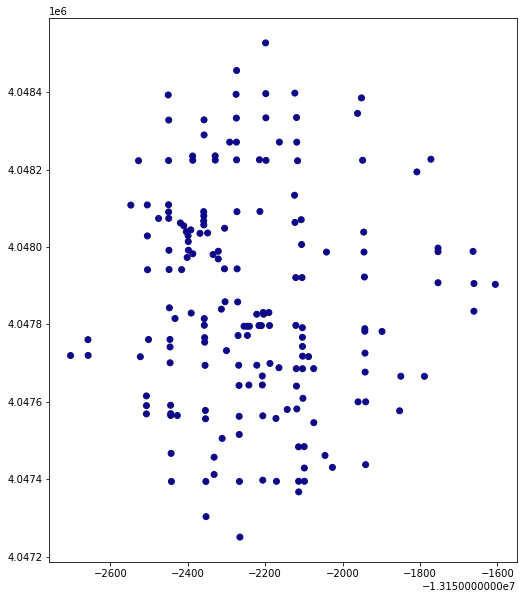

In [99]:
gdf_10.plot(figsize=(10,10),color=gdf_10.color)

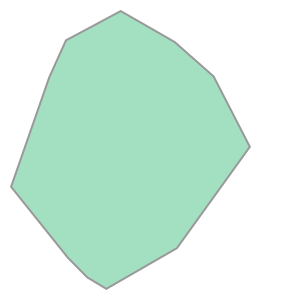

In [100]:
#creating our convex hull
gdf_10.unary_union.convex_hull

In [101]:
isochrones = gdf_nodes.dissolve("time")
isochrones

,geometry,y,x,highway,street_count,lon,lat,color
time,,,,,,,,
10 mins,"MULTIPOINT (-13152703.098 4047719.535, -131526...",4.048393e+06,-1.315245e+07,traffic_signals,4,-118.150475,34.145775,#0d0887


In [102]:
isochrones = isochrones.convex_hull.reset_index()
isochrones

,time,0
0,10 mins,"POLYGON ((-13152265.489 4047250.399, -13152352..."


In [103]:
isochrones.columns=['time','geometry']
isochrones

,time,geometry
0,10 mins,"POLYGON ((-13152265.489 4047250.399, -13152352..."


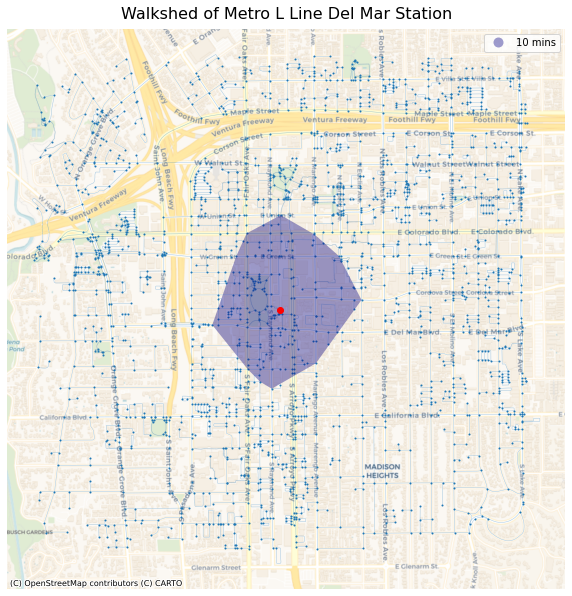

In [104]:
#plotting the convex hull on to the basemap

# set up the subplots
fig, ax = plt.subplots(figsize=(10,20))

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

# hide the axis
ax.axis('off')

# give it a title
ax.set_title('Walkshed of Metro L Line Del Mar Station',fontsize=16,pad=10)

# add the basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

And there we have it! The convex hull of the 10 minute walkshed from Del Mar Station. Time to move on to the ACS data.

<AxesSubplot:>

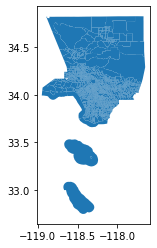

In [105]:
#Double checking our spatial data

gdf.plot()

In [106]:
# Quick peek at our data types, making sure our numbers a float types

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2345 entries, 0 to 2344
Data columns (total 41 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   FIPS                                            2345 non-null   object  
 1   Census Tract                                    2345 non-null   object  
 2   11 Total Population                             2345 non-null   float64 
 3   11 Total Foreign Born                           2345 non-null   float64 
 4   11 Europe                                       2345 non-null   float64 
 5   11 Europe Entered 2000 or later                 2345 non-null   float64 
 6   11 Asia                                         2345 non-null   float64 
 7   11 Asia Entered 2000 or later                   2345 non-null   float64 
 8   11 Latin America                                2345 non-null   float64 
 9   11 Caribbean          

In [107]:
# And another peek at our data set again before moving on to mapping

gdf.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012.0,2027.0,93.0,15.0,1467.0,303.0,449.0,0.0,0.0,412.0,137.0,42.0,275.0,55.0,37.0,8.0,18.0,9.0,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",-7.195213
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584.0,1254.0,144.0,0.0,1026.0,87.0,66.0,8.0,0.0,46.0,34.0,0.0,12.0,0.0,12.0,0.0,18.0,0.0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",-11.200293
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529.0,3471.0,39.0,0.0,1919.0,561.0,1458.0,0.0,0.0,1420.0,710.0,65.0,710.0,512.0,38.0,0.0,55.0,30.0,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",-3.265223
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751.0,1242.0,61.0,0.0,673.0,98.0,437.0,10.0,0.0,419.0,313.0,78.0,106.0,0.0,8.0,0.0,71.0,71.0,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.097513
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123.0,1374.0,97.0,0.0,1168.0,141.0,62.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,40.0,0.0,47.0,15.0,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",9.362702


### Starting to Build Our Foreign Born Percent by Census Tract Map Layer

Our data is nice and neat, so let's move on to creating our final maps with overlays.

<AxesSubplot:>

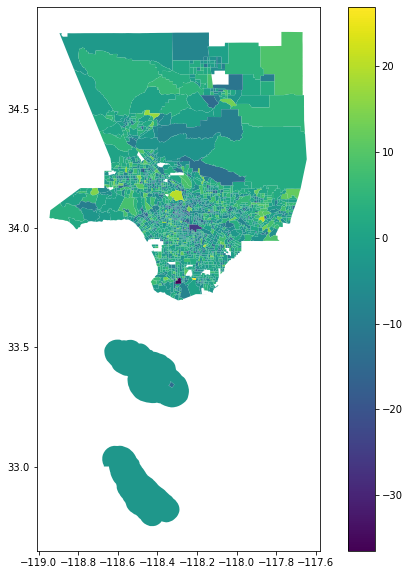

In [108]:
#Looking at our data as a choropleth for all of LA County

gdf.plot(figsize=(10,10),
        column='% Change Foreign Born',
        legend=True)

In [109]:
#Isolating our Del Mar Station walkshed census tracts

delmar = gdf[gdf["FIPS"].isin(['06037461902',  
                                '06037463602', 
                                '06037463700']
)
            ]

In [110]:
delmar.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
1360,06037461902,"Census Tract 4619.02, Los Angeles, CA",1306.0,321.0,39.0,2.0,141.0,0.0,113.0,0.0,0.0,113.0,84.0,0.0,29.0,0.0,0.0,0.0,28.0,0.0,1801.0,586.0,265.0,46.0,38.0,468.0,227.0,44.0,0.0,0.0,28.0,28.0,0.0,0.0,0.0,16.0,0.0,28.0,0.0,"MULTIPOLYGON (((-118.15570 34.14973, -118.1554...",7.958612
1382,06037463602,"Census Tract 4636.02, Los Angeles, CA",5047.0,1613.0,327.0,108.0,851.0,234.0,345.0,86.0,0.0,166.0,78.0,14.0,88.0,52.0,93.0,33.0,90.0,28.0,6057.0,1926.0,818.0,145.0,72.0,1457.0,627.0,212.0,6.0,0.0,185.0,77.0,19.0,108.0,0.0,21.0,0.0,112.0,100.0,"MULTIPOLYGON (((-118.15046 34.14577, -118.1497...",-0.161660
1383,06037463700,"Census Tract 4637, Los Angeles, CA",2203.0,295.0,39.0,23.0,184.0,72.0,62.0,0.0,0.0,34.0,22.0,0.0,12.0,0.0,28.0,0.0,10.0,0.0,3138.0,602.0,126.0,108.0,39.0,314.0,79.0,126.0,0.0,0.0,101.0,61.0,0.0,40.0,0.0,25.0,8.0,54.0,0.0,"MULTIPOLYGON (((-118.16776 34.14147, -118.1676...",5.793363


<AxesSubplot:>

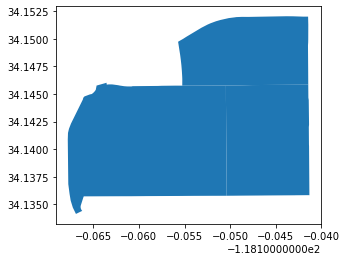

In [111]:
#Quick check to make sure it looks right

delmar.plot()

In [112]:
delmar.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3 entries, 1360 to 1383
Data columns (total 41 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   FIPS                                            3 non-null      object  
 1   Census Tract                                    3 non-null      object  
 2   11 Total Population                             3 non-null      float64 
 3   11 Total Foreign Born                           3 non-null      float64 
 4   11 Europe                                       3 non-null      float64 
 5   11 Europe Entered 2000 or later                 3 non-null      float64 
 6   11 Asia                                         3 non-null      float64 
 7   11 Asia Entered 2000 or later                   3 non-null      float64 
 8   11 Latin America                                3 non-null      float64 
 9   11 Caribbean          

<AxesSubplot:>

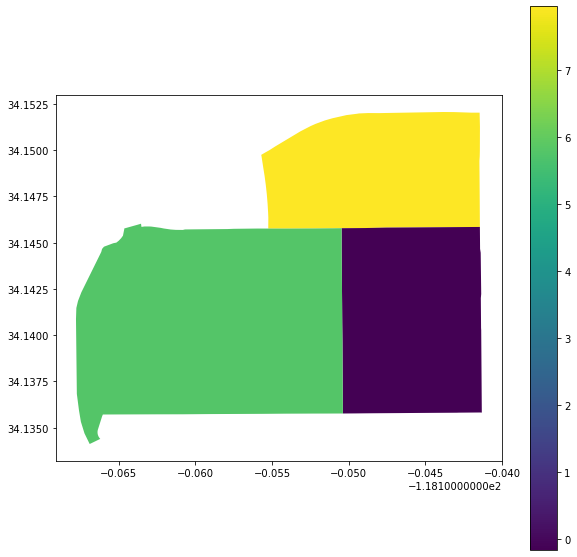

In [113]:
#Fairly narrow range of percentage foreign born here, with a noticeably higher percentage to the north

delmar.plot(figsize=(10,10),
        column='% Change Foreign Born',
        legend=True)

### Bringing it all together

First, let's project our map to web mercator

In [114]:
delmar_web_mercator = delmar.to_crs(epsg=3857)

Lets add a basemap and some details

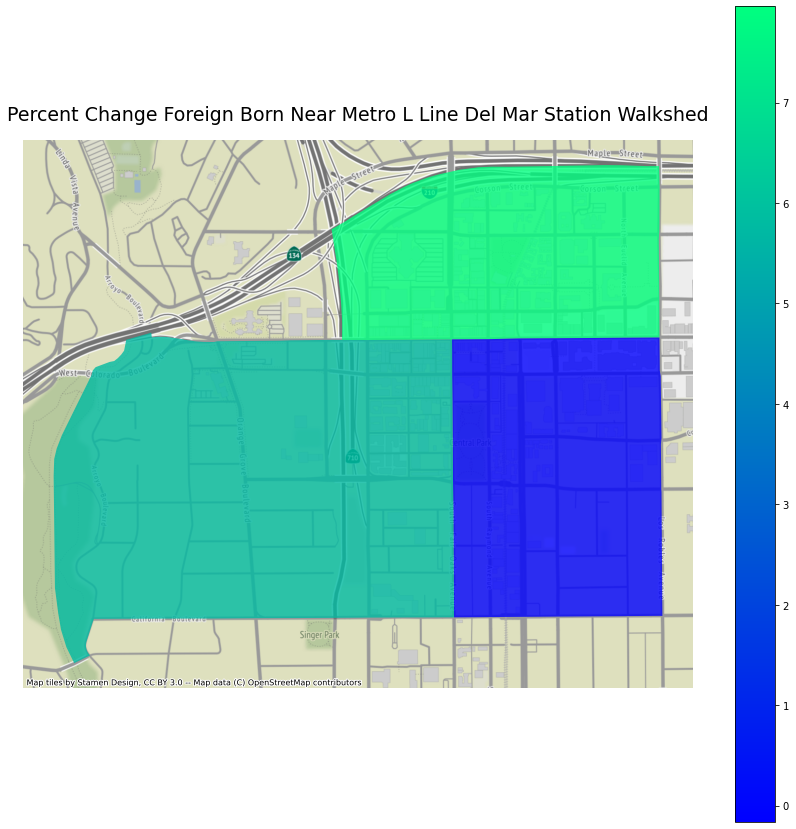

In [115]:
fig, ax = plt.subplots(figsize=(15, 15))
 
delmar_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Change Foreign Born Near Metro L Line Del Mar Station Walkshed',fontsize=19, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.Terrain)
#how can we add a legend and bins to this?

Looking good! Let's layer the isochrone layer on top to show us the walkshed from Del Mar Station

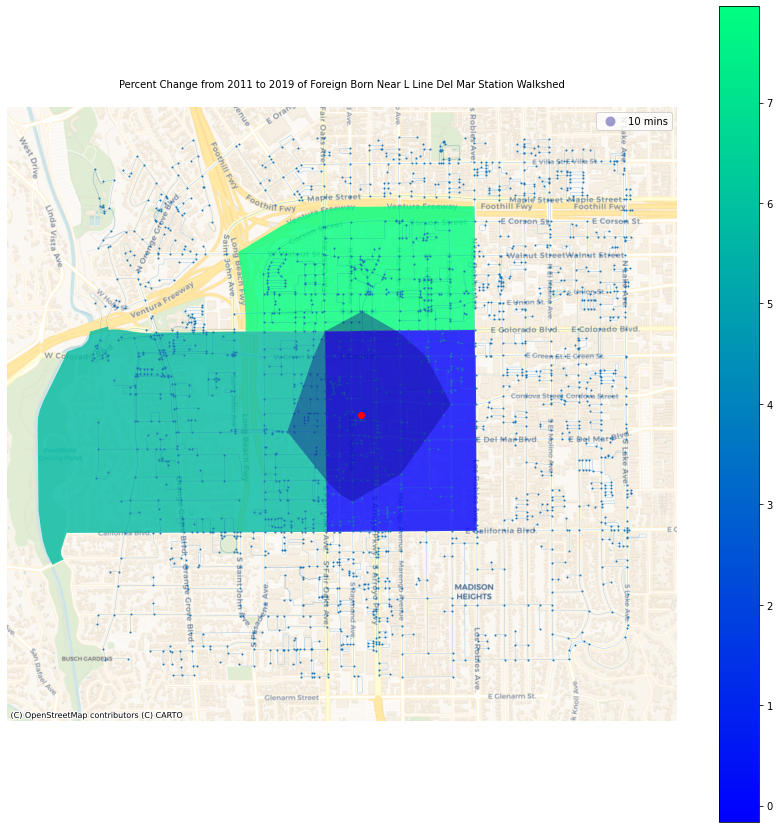

In [116]:
fig, ax = plt.subplots(figsize=(15, 15))
 
delmar_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

ax.axis('off')

ax.set_title('Percent Change from 2011 to 2019 of Foreign Born Near L Line Del Mar Station Walkshed',fontsize=10, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

We see a higher proportion of foreign born population to the east of the station, and the station is in the largest census tract. There is more multi-family housing east of Arroyo Parkway, and is noticeably more dense than the western most census tract, which is along Orange Grove Blvd. This tract has more single family homes and considerably higher property values, along with an archery range, country club, and the Rose Bowl Parade headquarters.

### Percentage of Foreign Born Population in Metro L Line Chinatown Station Walkshed

Let's create a choropleth map of the Chinatown Station showing the percent Foreign Born population within the station walkshed. 

In [117]:
address = 'Chinatown Station, College Street, New Chinatown, Chinatown, Los Angeles, Los Angeles County, California, 90012, United States'
network_type = 'walk'
trip_times = [10] #in minutes
meters_per_minute = 80 # travel distance per minute

In [118]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# download the street network
G = ox.graph_from_address(address, network_type=network_type, dist = 1500)

CPU times: user 4.32 s, sys: 64 ms, total: 4.39 s
Wall time: 4.4 s


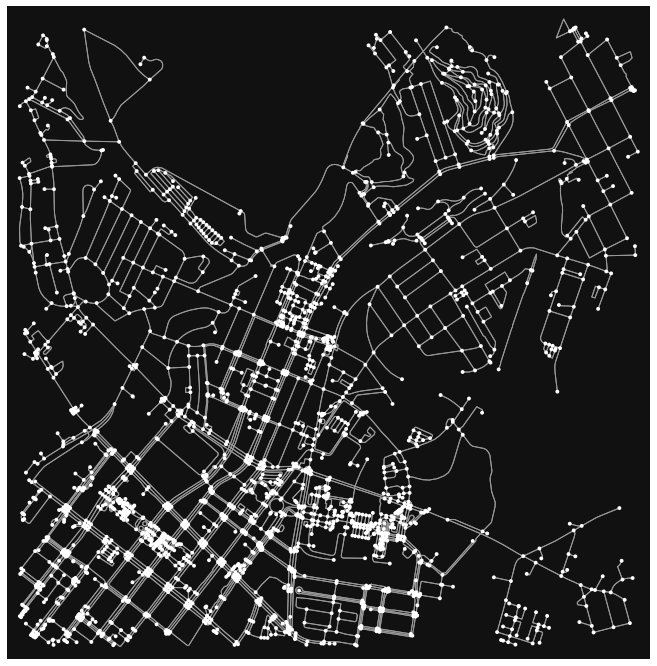

In [119]:
fig, ax = ox.plot_graph(G,figsize=(12,12))

In [120]:
G = ox.project_graph(G, to_crs='epsg:3857')

In [121]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [122]:
gdf_nodes.head()

,y,x,street_count,lon,lat,highway,geometry
osmid,,,,,,,
15027548,4.039027e+06,-1.316061e+07,3,-118.223785,34.076114,NaN,POINT (-13160611.557 4039026.875)
67619407,4.039118e+06,-1.316050e+07,4,-118.222746,34.076796,traffic_signals,POINT (-13160495.907 4039118.493)
123283621,4.038908e+06,-1.316055e+07,3,-118.223245,34.075226,NaN,POINT (-13160551.456 4038907.559)
15027549,4.038710e+06,-1.316045e+07,4,-118.222311,34.073758,traffic_signals,POINT (-13160447.416 4038710.296)
3723806094,4.038716e+06,-1.316045e+07,4,-118.222338,34.073802,NaN,POINT (-13160450.467 4038716.075)


### Plotting the station area

<AxesSubplot:>

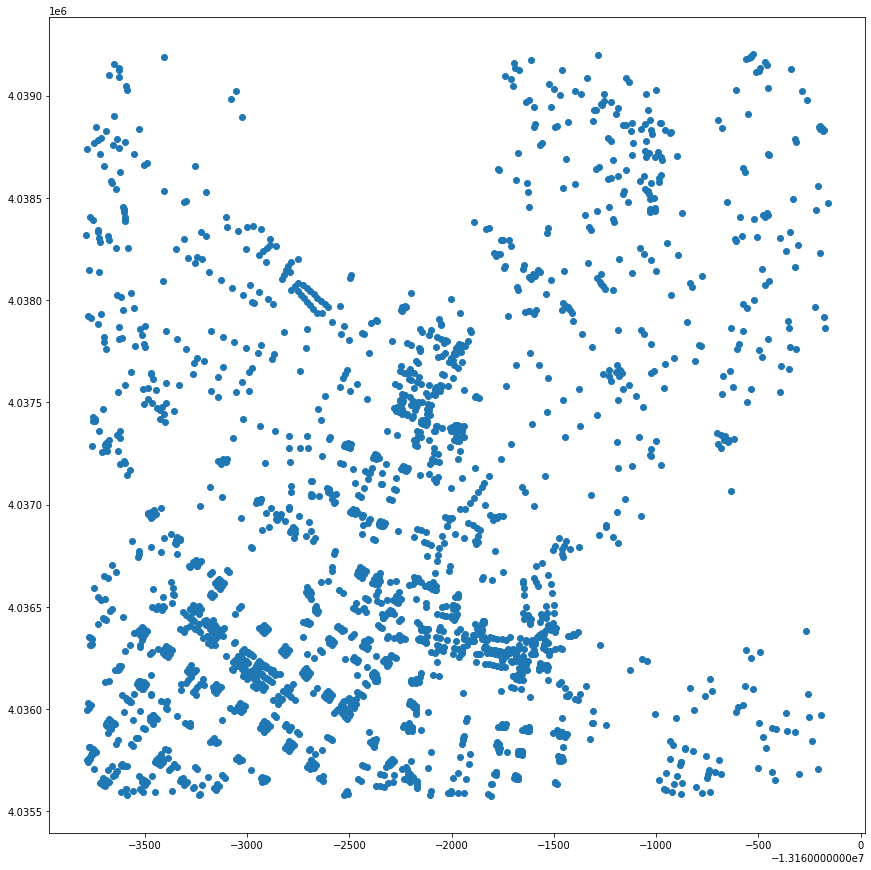

In [123]:
gdf_nodes.plot(figsize=(15,15))

In [124]:
gdf_edges.head()

osmid               name    highway  oneway  \
u        v          key                                                    
15027548 67619407   0      9126419    Humboldt Street   tertiary   False   
         123283621  0    358037415          Avenue 19   tertiary   False   
67619407 7871476832 0      9126419    Humboldt Street   tertiary   False   
         6787624912 0    398398790  San Fernando Road  secondary   False   
         15027548   0      9126419    Humboldt Street   tertiary   False   

                          length  \
u        v          key            
15027548 67619407   0    122.072   
         123283621  0    110.537   
67619407 7871476832 0     41.864   
         6787624912 0     67.319   
         15027548   0    122.072   

                                                                  geometry  \
u        v          key                                                      
15027548 67619407   0    LINESTRING (-13160611.557 4039026.875, -131605...   
         123283621  0    LINESTRING (-13160611.557 4039026.875, -131606...   
67619407 7871476832 0    LINESTRING (-13160495.907 4039118.493, -131604...   
         6787624912 0    LINESTRING (-13160495.907 4039118.493, -131605...   
         15027548   0    LINESTRING (-13160495.907 4039118.493, -131605...   

                        lanes maxspeed bridge service access tunnel width  
u        v          key                                                    
15027548 67619407   0     NaN      NaN    NaN     NaN    NaN    NaN   NaN  
         123283621  0       2      NaN    NaN     NaN    NaN    NaN   NaN  
67619407 7871476832 0     NaN      NaN    NaN     NaN    NaN    NaN   NaN  
         6787624912 0       4      NaN    NaN     NaN    NaN    NaN   NaN  
         15027548   0     NaN      NaN    NaN     NaN    NaN    NaN   NaN

<AxesSubplot:>

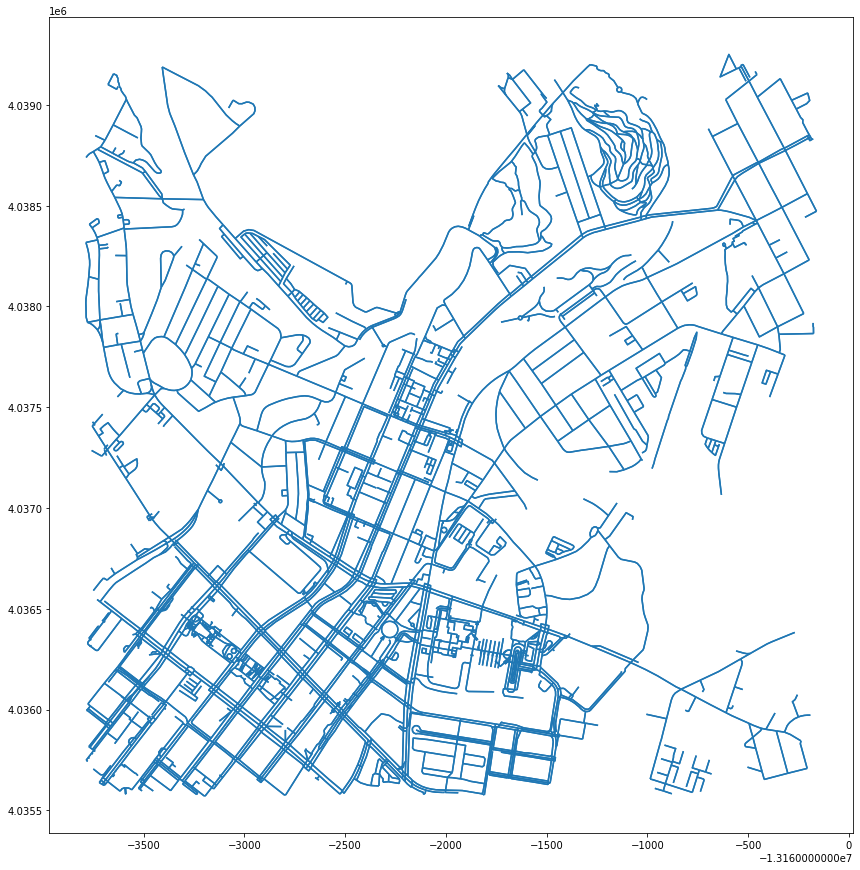

In [125]:
gdf_edges.plot(figsize=(15,15))

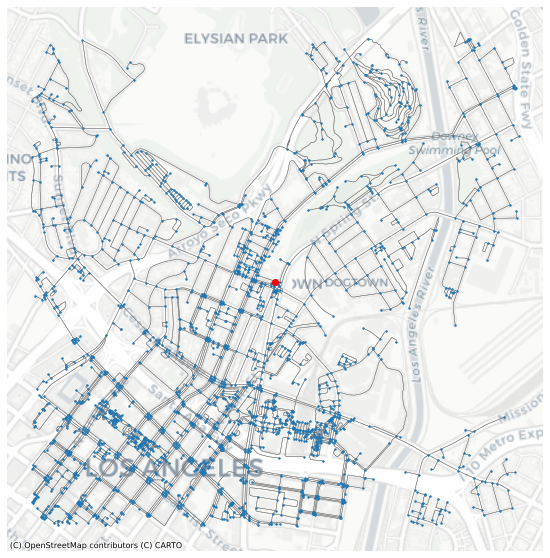

In [126]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)

# add the center node in red also to ax
gdf_nodes.loc[[8290553634]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [127]:
gdf_edges.sample(5)

,,,osmid,name,highway,oneway,length,geometry,lanes,maxspeed,bridge,service,access,tunnel,width
u,v,key,,,,,,,,,,,,,
1378071132,7672084082,0,405178819,North Alameda Street,primary,False,9.521,"LINESTRING (-13162172.635 4036147.627, -131621...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
4409182204,4409000978,1,"[443287538, 443287452, 443319231]",NaN,"[footway, steps]",False,25.823,"LINESTRING (-13161888.236 4036359.492, -131618...",NaN,NaN,NaN,NaN,NaN,yes,NaN
9445478743,7672088723,0,821669118,NaN,footway,False,79.598,"LINESTRING (-13162373.455 4036137.537, -131624...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3259213628,2163516474,0,319505716,Grand Avenue Lower Level,unclassified,False,134.686,"LINESTRING (-13163470.742 4036165.484, -131635...",NaN,NaN,NaN,NaN,NaN,yes,NaN
7672090942,7672090943,0,821669406,NaN,footway,False,13.086,"LINESTRING (-13162189.277 4036009.894, -131621...",NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
gdf_edges['walk_time'] = (gdf_edges['length']/meters_per_minute)

In [129]:
gdf_edges.sample(5)

,,,osmid,name,highway,oneway,length,geometry,lanes,maxspeed,bridge,service,access,tunnel,width,walk_time
u,v,key,,,,,,,,,,,,,,
4409000542,4409001322,0,"[443287419, 443287590]",NaN,footway,False,48.374,"LINESTRING (-13161764.704 4036282.877, -131617...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.604675
9032969264,9032969265,0,976090688,NaN,footway,False,9.506,"LINESTRING (-13163234.166 4036712.607, -131632...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.118825
6477068288,6477065384,0,"[690375010, 690375007]",NaN,footway,False,118.841,"LINESTRING (-13162569.500 4036771.810, -131625...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.485513
6883792659,27463245,0,398733940,North Alameda Street,primary,False,15.999,"LINESTRING (-13162201.300 4035682.851, -131622...",4,NaN,NaN,NaN,NaN,NaN,NaN,0.199988
8409454505,8409454506,0,905542286,NaN,service,False,29.800,"LINESTRING (-13162114.070 4037528.873, -131621...",NaN,NaN,NaN,parking_aisle,customers,NaN,NaN,0.372500


In [130]:
# assign a color hex code for each trip time isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap='plasma', 
                                start=0, 
                                return_hex=True)
print(trip_times)
print(iso_colors)

[10]
['#0d0887']


In [131]:
time_color = list(zip(trip_times, iso_colors))
time_color

[(10, '#0d0887')]

In [132]:
for time, color in list(time_color):

    # for each trip time, create an egograph of nodes that fall within that distance
    subgraph = nx.ego_graph(G, 8290553634, radius=time)

    print('There are ' + str(len(subgraph.nodes())) + ' nodes within ' + str(time) + ' minutes ')
    
    # for each of those nodes, update the gdf_nodes dataframe and assign it with its associated distance color
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = str(time) + ' mins'
        gdf_nodes.loc[node,'color'] = color

There are 173 nodes within 10 minutes 


In [133]:
gdf_nodes.sample(30)

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
3297553264,4.035725e+06,-1.316362e+07,3,-118.250775,34.051542,NaN,POINT (-13163616.081 4035724.972),NaN,NaN
2094721978,4.038731e+06,-1.316106e+07,3,-118.227769,34.073910,NaN,POINT (-13161055.032 4038730.683),NaN,NaN
7863906869,4.037580e+06,-1.316205e+07,4,-118.236665,34.065345,NaN,POINT (-13162045.296 4037579.695),10 mins,#0d0887
268642979,4.036503e+06,-1.316324e+07,3,-118.247357,34.057336,NaN,POINT (-13163235.580 4036503.478),NaN,NaN
122937662,4.037525e+06,-1.316220e+07,3,-118.238068,34.064941,NaN,POINT (-13162201.556 4037525.393),10 mins,#0d0887
122851148,4.037538e+06,-1.316068e+07,3,-118.224391,34.065037,stop,POINT (-13160679.005 4037538.280),NaN,NaN
8400881072,4.036292e+06,-1.316146e+07,1,-118.231424,34.055759,NaN,POINT (-13161461.904 4036291.557),NaN,NaN
6732245813,4.037197e+06,-1.316253e+07,4,-118.241047,34.062500,NaN,POINT (-13162533.176 4037197.286),NaN,NaN
15027548,4.039027e+06,-1.316061e+07,3,-118.223785,34.076114,NaN,POINT (-13160611.557 4039026.875),NaN,NaN


In [134]:
gdf_nodes['color'].fillna('#cccccc', inplace=True)

In [135]:
gdf_nodes.sample(5)

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
2889730931,4.035969e+06,-1.316346e+07,1,-118.249373,34.053356,NaN,POINT (-13163459.978 4035968.645),NaN,#cccccc
7672090943,4.036003e+06,-1.316218e+07,3,-118.237832,34.053608,crossing,POINT (-13162175.284 4036002.531),NaN,#cccccc
6477099080,4.037228e+06,-1.316238e+07,4,-118.239715,34.062730,NaN,POINT (-13162384.821 4037228.273),NaN,#cccccc
8290762645,4.037062e+06,-1.316260e+07,3,-118.241685,34.061494,NaN,POINT (-13162604.109 4037062.106),NaN,#cccccc
1842838208,4.037525e+06,-1.316314e+07,3,-118.246526,34.064940,NaN,POINT (-13163143.007 4037525.151),NaN,#cccccc


<AxesSubplot:>

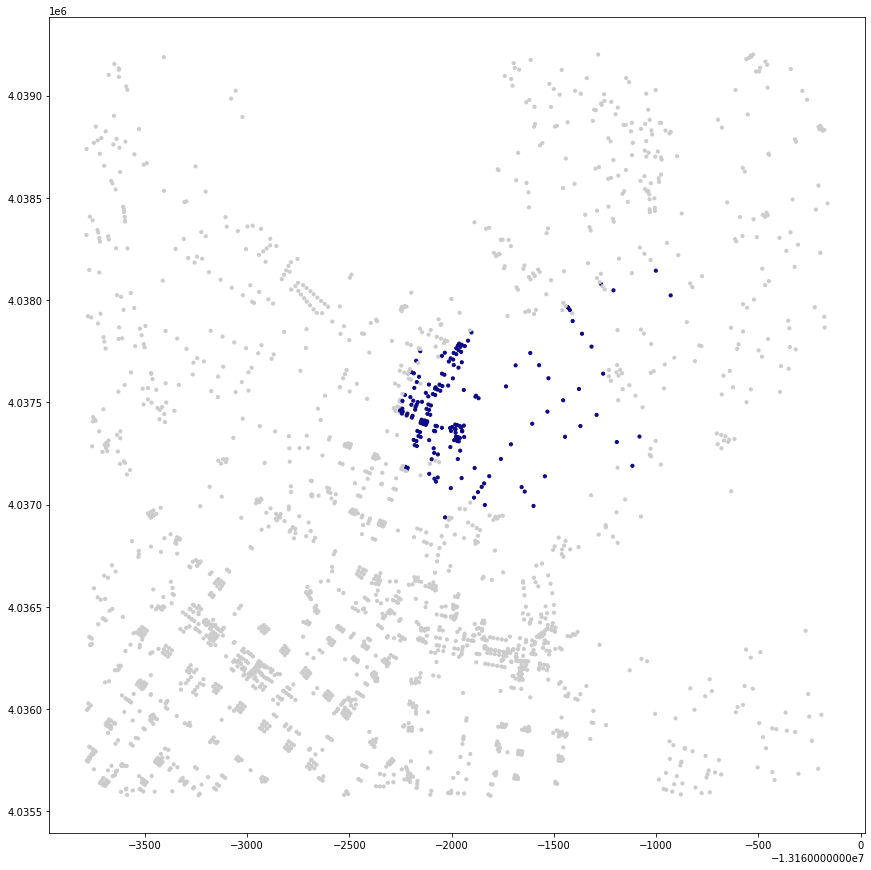

In [136]:
gdf_nodes.plot(figsize=(15,15),
               color=gdf_nodes['color'],
               markersize=10)

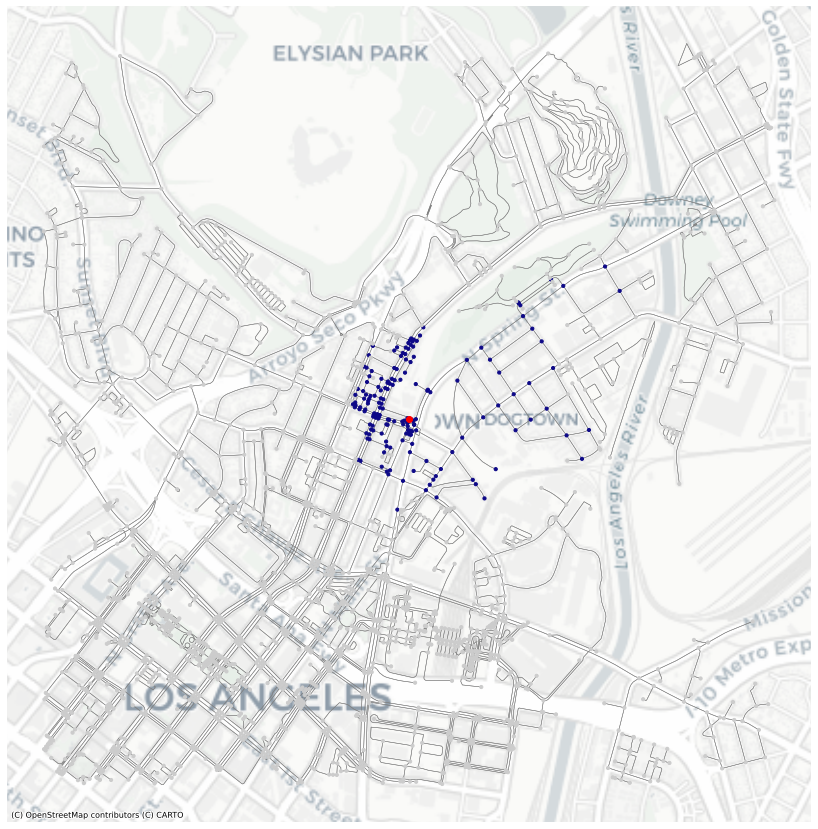

In [137]:
# a "full" map
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(15,15))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax,
               color=gdf_nodes['color'],
               markersize=10, 
               zorder=20)

# marking the station site with a red dot. Grabbed the station's node from OpenStreet Maps
gdf_nodes.loc[[8290553634]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [138]:
gdf_nodes[gdf_nodes['time']=='10 mins']

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
15717265,4.038144e+06,-1.316100e+07,4,-118.227285,34.069542,traffic_signals,POINT (-13161001.164 4038143.644),10 mins,#0d0887
122656713,4.038023e+06,-1.316093e+07,4,-118.226635,34.068642,NaN,POINT (-13160928.751 4038022.752),10 mins,#0d0887
123037729,4.038048e+06,-1.316121e+07,4,-118.229147,34.068827,NaN,POINT (-13161208.430 4038047.599),10 mins,#0d0887
17677673,4.037351e+06,-1.316198e+07,3,-118.236082,34.063645,NaN,POINT (-13161980.397 4037351.213),10 mins,#0d0887
67619377,4.037281e+06,-1.316201e+07,3,-118.236313,34.063122,NaN,POINT (-13162006.145 4037280.975),10 mins,#0d0887
...,...,...,...,...,...,...,...,...,...
8409454505,4.037529e+06,-1.316211e+07,1,-118.237282,34.064967,NaN,POINT (-13162114.070 4037528.873),10 mins,#0d0887
8409457169,4.037488e+06,-1.316217e+07,3,-118.237797,34.064661,NaN,POINT (-13162171.299 4037487.673),10 mins,#0d0887
8409457171,4.037477e+06,-1.316218e+07,1,-118.237841,34.064580,NaN,POINT (-13162176.286 4037476.802),10 mins,#0d0887


In [139]:
gdf_10 = gdf_nodes[gdf_nodes['time']=='10 mins']

<AxesSubplot:>

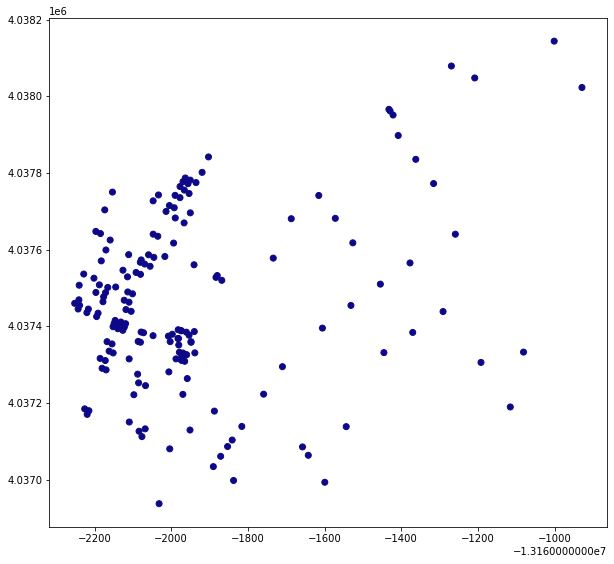

In [140]:
gdf_10.plot(figsize=(10,10),color=gdf_10.color)

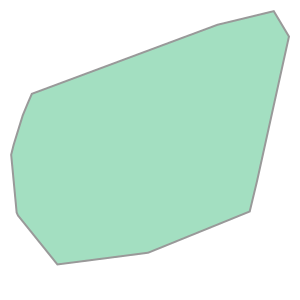

In [141]:
gdf_10.unary_union.convex_hull

In [142]:
# Getting a oblong asymmetrical shape here. Code seems right so there's something up here... Maybe it has to do with osmnx? Or maybe it's just the topology of the station area?

isochrones = gdf_nodes.dissolve("time")
isochrones

,geometry,y,x,street_count,lon,lat,highway,color
time,,,,,,,,
10 mins,"MULTIPOINT (-13162251.772 4037459.803, -131622...",4.038144e+06,-1.316100e+07,4,-118.227285,34.069542,traffic_signals,#0d0887


In [143]:
isochrones = isochrones.convex_hull.reset_index()
isochrones

,time,0
0,10 mins,"POLYGON ((-13162031.671 4036937.288, -13162219..."


In [144]:
isochrones.columns=['time','geometry']
isochrones

,time,geometry
0,10 mins,"POLYGON ((-13162031.671 4036937.288, -13162219..."


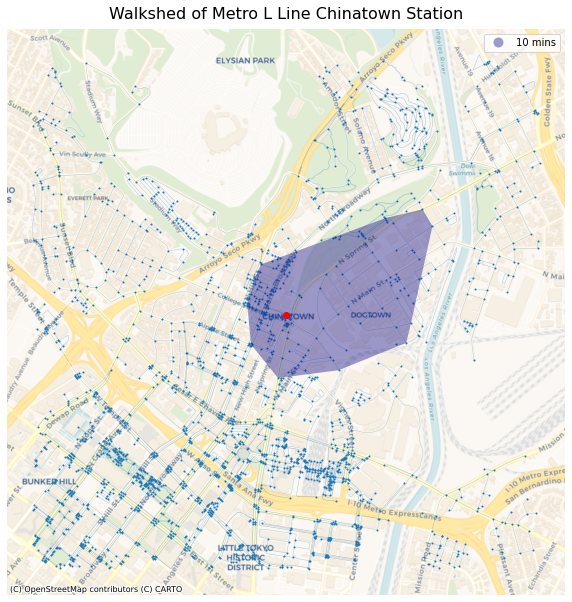

In [145]:
# set up the subplots
fig, ax = plt.subplots(figsize=(10,20))

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[8290553634]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

# hide the axis
ax.axis('off')

# give it a title
ax.set_title('Walkshed of Metro L Line Chinatown Station',fontsize=16,pad=10)

# add the basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

### Choropleth map of percent foreign born in the Chinatown Station walkshed

Now we pivot to create the choropleth map of the percent foreign born in the census tracts in our station walkshed.

### Isolating Our Chinatown Walkshed

Based on the walk shed map we created, we use its nodes to cross reference a census tract map and identify the tracts in our walkshed. We now isolate those tracts into its own variable.

In [146]:
Chinatown = gdf[gdf["FIPS"].isin(['06037206010', 
                                       '06037207103', 
                                       '06037207102',
                                       '06037206020']
                                      )
                     ]

In [147]:
Chinatown.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
529,06037206010,"Census Tract 2060.10, Los Angeles, CA",2947.0,1661.0,18.0,0.0,926.0,290.0,714.0,11.0,0.0,703.0,635.0,29.0,68.0,0.0,0.0,0.0,3.0,3.0,4121.0,2059.0,238.0,10.0,0.0,1135.0,225.0,914.0,0.0,0.0,914.0,748.0,13.0,166.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",-6.398801
530,06037206020,"Census Tract 2060.20, Los Angeles, CA",7677.0,1404.0,14.0,0.0,189.0,17.0,1187.0,55.0,24.0,1099.0,773.0,153.0,326.0,72.0,33.0,0.0,14.0,9.0,8947.0,1074.0,113.0,116.0,15.0,242.0,54.0,696.0,7.0,7.0,680.0,448.0,14.0,232.0,23.0,9.0,0.0,20.0,0.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378...",-6.284370
537,06037207102,"Census Tract 2071.02, Los Angeles, CA",2276.0,1753.0,1.0,0.0,1592.0,799.0,160.0,38.0,0.0,102.0,72.0,0.0,30.0,0.0,20.0,0.0,0.0,0.0,2926.0,1837.0,114.0,50.0,29.0,1465.0,71.0,321.0,1.0,1.0,295.0,181.0,0.0,114.0,0.0,25.0,13.0,1.0,0.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",-14.239135
538,06037207103,"Census Tract 2071.03, Los Angeles, CA",2098.0,1728.0,0.0,0.0,1688.0,626.0,22.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,0.0,0.0,18.0,18.0,2393.0,1649.0,411.0,16.0,11.0,1551.0,389.0,76.0,6.0,0.0,30.0,12.0,0.0,18.0,0.0,40.0,11.0,6.0,0.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",-13.454837


<AxesSubplot:>

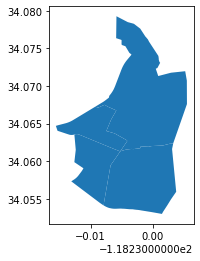

In [148]:
Chinatown.plot()

There's our census tracts. Let's add some statistics to these census tracts. 

<AxesSubplot:>

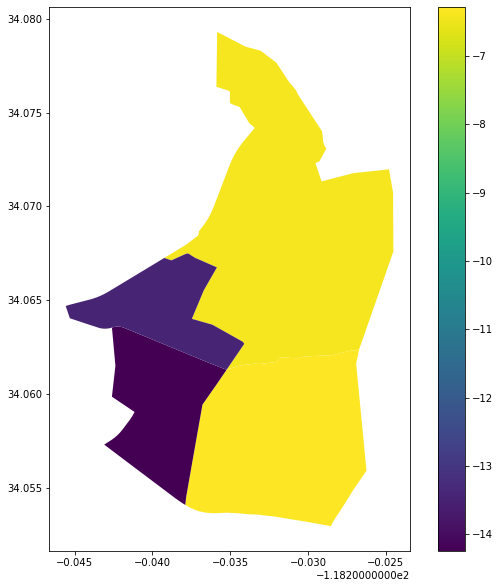

In [149]:
Chinatown.plot(figsize=(10,10),
        column='% Change Foreign Born',
        legend=True)

Wow, there's a census tract north of our station that has more than a 60% foreign born population. Let's add some map detail like titles and a basemap. 

### Adding a base map and map details

We first have to project our data to web mercator.

In [150]:
Chinatown_web_mercator = Chinatown.to_crs(epsg=3857)

Now we can tap into adding map details and our basemap.

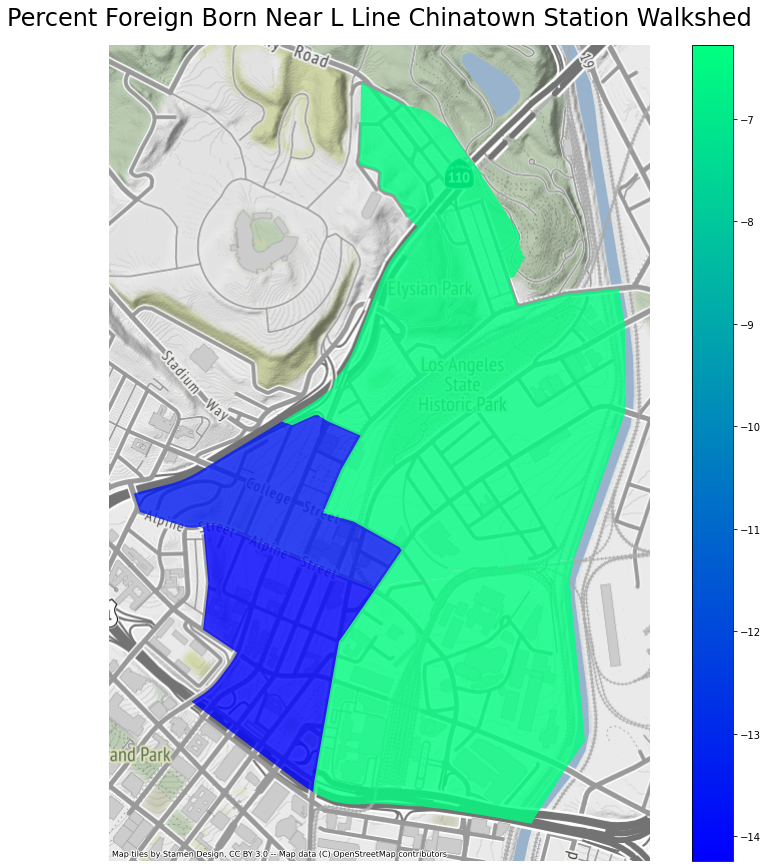

In [151]:
fig, ax = plt.subplots(figsize=(15, 15))
 
Chinatown_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Foreign Born Near L Line Chinatown Station Walkshed',fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.Terrain)

Nice! Let's layer our isochrone map with our choropleth map.

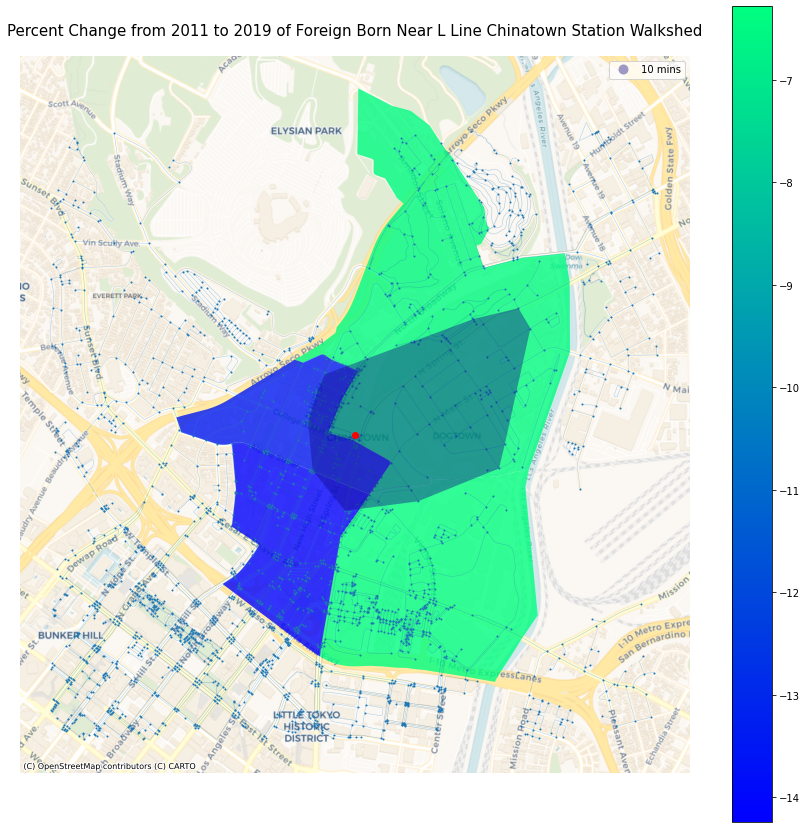

In [152]:
fig, ax = plt.subplots(figsize=(15, 15))
 
Chinatown_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[8290553634]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

ax.axis('off')

ax.set_title('Percent Change from 2011 to 2019 of Foreign Born Near L Line Chinatown Station Walkshed',fontsize=15, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

Great! As we can see there's a high percentage of foreign born residents north of the station. South of the station there's approximately only 20% foreign born. That's less than the 34% county average (to see the county average for foreign born, run the cell below and scroll to the last column).

This dark blue census tract is also unique in that it is the highest populated tract in our walkshed but is very industrial. The tract likely gets its density from the Twin Towers Correctional Facility. There is little affordable housing in this census tract. The two main housing options are 272-unit luxury apartments on Cesar Chavez and Alameda, and market rate housing next to Union Station. These options likely do not meet the needs of foreign born residents who tend to skew lower income.  

## Plotly Bar Charts to Explore Our Data in a Different Way


Using a function and for loop for each station area, we used plotly to create bar graphs to show trends in foreign born populations in each station walkshed, and also the broader neighborhood/city. We trimmed and manipulated our data to show each ethnicity's population as a percentage relative to the total number of foreign born residents in the station area and/or neighborhood. We then re-organized the data into a Pandas DataFrame so that we had a column of all of the ethnicities, and a column each for the years of entry.

In [153]:
# Listing out our station areas as FIPS codes to feed into a function for loop

delmar = ['06037461902', '06037463602', '06037463700']

In [154]:
chinatown = ['06037206010', '06037207103', '06037207102', '06037206020']

In [155]:
# Ok let's take a stab at making a function to trim our data to give us the above table for each station

def stn_chart19(stop): 
    # Using .isin to single out the rows we want
    df = gdf[gdf["FIPS"].isin(stop)]
    
    df = df.append(df.sum(numeric_only=True), ignore_index=True)
    
    
     # Keeping only summation row
    df = df.iloc[-1:]
    
    
    # Creating percentages
    df['Foreign Born'] = df['19 Total Foreign Born']/df['19 Total Population']*100
    df['Europe'] = df['19 Europe']/df['19 Total Foreign Born']*100
    df['Asia'] = df['19 Asia']/df['19 Total Foreign Born']*100
    df['Latin America'] = df['19 Latin America']/df['19 Total Foreign Born']*100
    df['Caribbean'] = df['19 Caribbean']/df['19 Total Foreign Born']*100
    df['Central America'] = df['19 Central America']/df['19 Total Foreign Born']*100
    df['Mexico'] = df['19 Mexico']/df['19 Total Foreign Born']*100
    df['Other Central America'] = df['19 Other Central America']/df['19 Total Foreign Born']*100
    df['South America'] = df['19 South America']/df['19 Total Foreign Born']*100
    df['Other Areas'] = df['19 Other Areas Entered 2010 or later']/df['19 Total Foreign Born']*100

    
    # Flipping rows and columns
    df = df.transpose()
    
    # Reseting index
    df = df.reset_index()
    
    # Renaming columns
    df.columns = ['Country of Origin', 'Percentage of Total Foreign Born']
    
    # Keeping only the percentage rows
    df = df.drop(df.index[0:41])
    
    display(df)
    
    # Plotting
    
    graph = px.bar(df, x="Country of Origin", y="Percentage of Total Foreign Born", 
                   title=('Foreign Born Population Breakdown')
        )
    
    display(graph)


,Country of Origin,Percentage of Total Foreign Born
41,Foreign Born,28.319389
42,Europe,9.601798
43,Asia,71.901092
44,Latin America,12.26718
45,Caribbean,0.192678
46,Central America,10.083494
47,Mexico,5.330764
48,Other Central America,4.75273
49,South America,1.991008
50,Other Areas,3.211304


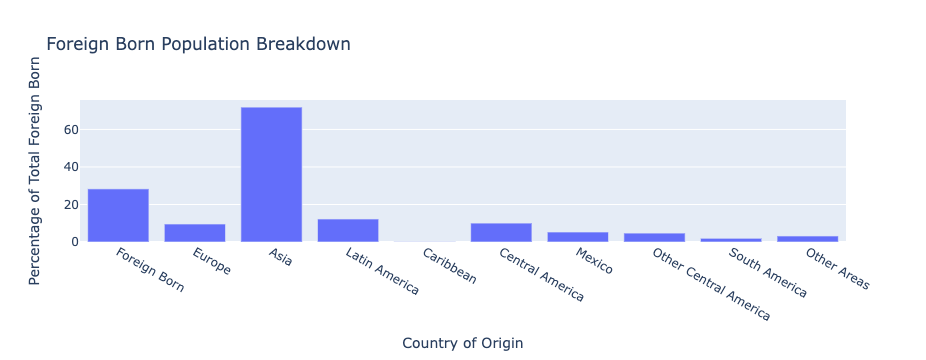

In [156]:
# Function testing before the for loop

stn_chart19(stop = delmar) 

,Country of Origin,Percentage of Total Foreign Born
41,Foreign Born,35.99826
42,Europe,2.90074
43,Asia,66.369542
44,Latin America,30.321801
45,Caribbean,0.211512
46,Central America,28.992295
47,Mexico,20.985043
48,Other Central America,8.007252
49,South America,1.117994
50,Other Areas,0.0


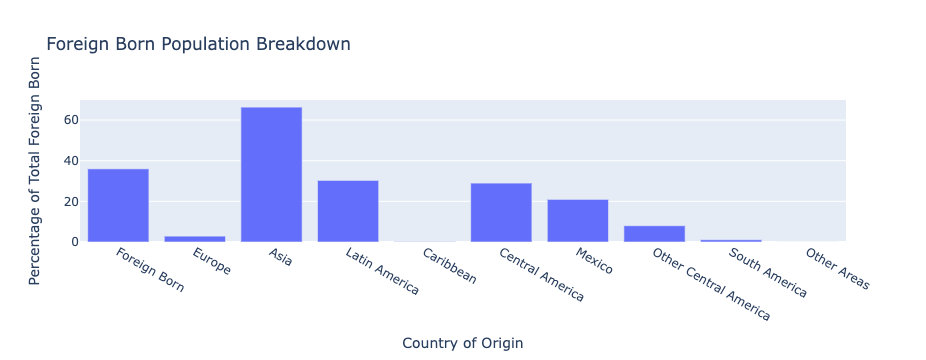

In [157]:
stn_chart19(stop=chinatown)

,Country of Origin,Percentage of Total Foreign Born
41,Foreign Born,28.319389
42,Europe,9.601798
43,Asia,71.901092
44,Latin America,12.26718
45,Caribbean,0.192678
46,Central America,10.083494
47,Mexico,5.330764
48,Other Central America,4.75273
49,South America,1.991008
50,Other Areas,3.211304


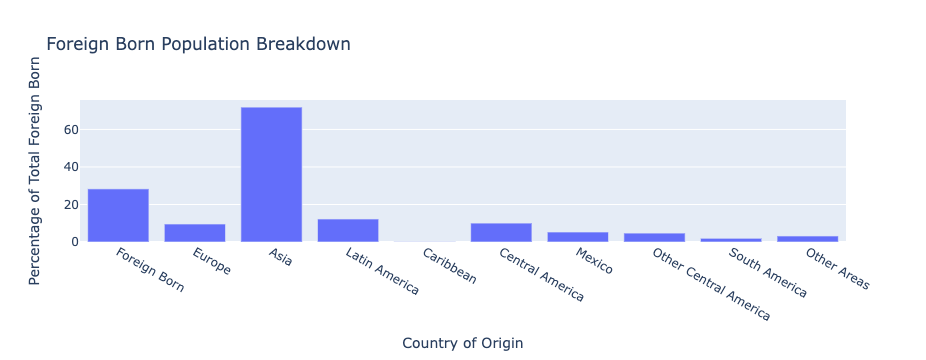

,Country of Origin,Percentage of Total Foreign Born
41,Foreign Born,35.99826
42,Europe,2.90074
43,Asia,66.369542
44,Latin America,30.321801
45,Caribbean,0.211512
46,Central America,28.992295
47,Mexico,20.985043
48,Other Central America,8.007252
49,South America,1.117994
50,Other Areas,0.0


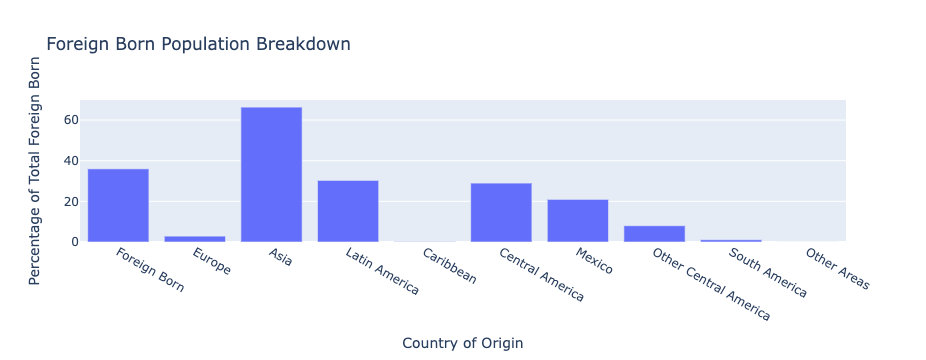

In [158]:
# Here's our for loop which we hope to feed more stations into

# list of neighborhoods
stations = [delmar, chinatown]

# call the function with a loop
for station in stations:
        stn_chart19(stop=station)

## Interactive Map of Foreign Born in Pasadena and Chinatown

We are interested in creating a map that shows the percent of foreign born in our entire neighborhoods, Chinatown and Pasadena.  

### Importing plotly

To create our interactive map, we'll use plotly.

In [159]:
# for interactive plots
import plotly.express as px

As a sidenote, we originally wanted our interactive map to show the percent foreign born for <strong><em>each</em></strong> ethnicity in our neighborhood census tracts. After tirelessly searching on stackoverflow, the plotly website, and other online resources, we found no method to successfully include more than one datapoint to a hover text box. For now, we leave the code we wrote that calculates the percent foreign born of each ethnicity for LA County census tracts with the intention of using it in the future.

In [160]:
gdf.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012.0,2027.0,93.0,15.0,1467.0,303.0,449.0,0.0,0.0,412.0,137.0,42.0,275.0,55.0,37.0,8.0,18.0,9.0,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",-7.195213
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584.0,1254.0,144.0,0.0,1026.0,87.0,66.0,8.0,0.0,46.0,34.0,0.0,12.0,0.0,12.0,0.0,18.0,0.0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",-11.200293
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529.0,3471.0,39.0,0.0,1919.0,561.0,1458.0,0.0,0.0,1420.0,710.0,65.0,710.0,512.0,38.0,0.0,55.0,30.0,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",-3.265223
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751.0,1242.0,61.0,0.0,673.0,98.0,437.0,10.0,0.0,419.0,313.0,78.0,106.0,0.0,8.0,0.0,71.0,71.0,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.097513
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123.0,1374.0,97.0,0.0,1168.0,141.0,62.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,40.0,0.0,47.0,15.0,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",9.362702


In [171]:
Per_Europe = (gdf['19 Europe']/gdf['19 Total Population'])*100
Per_Asia = (gdf['19 Asia']/gdf['19 Total Population'])*100
Per_Latin_America = (gdf['19 Latin America']/gdf['19 Total Population'])*100
Per_Caribbean = (gdf['19 Caribbean']/gdf['19 Total Population'])*100
Per_Central_America = (gdf['19 Central America']/gdf['19 Total Population'])*100
Per_Mexico = (gdf['19 Mexico']/gdf['19 Total Population'])*100
Per_Other_Central_America = (gdf['19 Other Central America']/gdf['19 Total Population'])*100
Per_South_America = (gdf['19 South America']/gdf['19 Total Population'])*100
Per_Other_Areas = (gdf['19 Other Areas']/gdf['19 Total Population'])*100

In [172]:
gdf['% Europe'] = Per_Europe
gdf['% Asia'] = Per_Asia
gdf['% Latin America'] = Per_Latin_America
gdf['% Caribbean'] = Per_Caribbean
gdf['% Central America'] = Per_Central_America
gdf['% Mexico'] = Per_Mexico
gdf['% Other Central America'] = Per_Other_Central_America
gdf['% South America'] = Per_South_America
gdf['% Other Areas'] = Per_Other_Areas

In [173]:
gdf.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born,% Europe,% Asia,% Latin America,% Caribbean,% Central America,% Mexico,% Other Central America,% South America,% Other Areas
0,06037101110,"Census Tract 1011.10, Los Angeles, CA",5012.0,2027.0,93.0,15.0,1467.0,303.0,449.0,0.0,0.0,412.0,137.0,42.0,275.0,55.0,37.0,8.0,18.0,9.0,4283.0,1424.0,217.0,131.0,7.0,818.0,160.0,446.0,8.0,0.0,329.0,310.0,26.0,19.0,0.0,109.0,24.0,29.0,0.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",-7.195213,3.058604,19.098763,10.413262,0.186785,7.681532,7.237917,0.443614,2.544945,0.677095
1,06037101122,"Census Tract 1011.22, Los Angeles, CA",3584.0,1254.0,144.0,0.0,1026.0,87.0,66.0,8.0,0.0,46.0,34.0,0.0,12.0,0.0,12.0,0.0,18.0,0.0,3405.0,810.0,45.0,75.0,10.0,690.0,35.0,24.0,0.0,0.0,24.0,0.0,0.0,24.0,0.0,0.0,0.0,21.0,0.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",-11.200293,2.202643,20.264317,0.704846,0.000000,0.704846,0.000000,0.704846,0.000000,0.616740
2,06037101210,"Census Tract 1012.10, Los Angeles, CA",6529.0,3471.0,39.0,0.0,1919.0,561.0,1458.0,0.0,0.0,1420.0,710.0,65.0,710.0,512.0,38.0,0.0,55.0,30.0,6347.0,3167.0,271.0,96.0,17.0,1846.0,181.0,1137.0,19.0,0.0,1004.0,499.0,0.0,505.0,73.0,114.0,0.0,88.0,0.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",-3.265223,1.512526,29.084607,17.913975,0.299354,15.818497,7.861982,7.956515,1.796124,1.386482
3,06037101220,"Census Tract 1012.20, Los Angeles, CA",2751.0,1242.0,61.0,0.0,673.0,98.0,437.0,10.0,0.0,419.0,313.0,78.0,106.0,0.0,8.0,0.0,71.0,71.0,3702.0,1749.0,184.0,149.0,7.0,1063.0,152.0,519.0,41.0,0.0,470.0,334.0,0.0,136.0,25.0,8.0,0.0,18.0,0.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.097513,4.024851,28.714209,14.019449,1.107509,12.695840,9.022150,3.673690,0.216099,0.486224
4,06037101300,"Census Tract 1013, Los Angeles, CA",4123.0,1374.0,97.0,0.0,1168.0,141.0,62.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,40.0,0.0,47.0,15.0,3884.0,1658.0,192.0,119.0,0.0,1346.0,192.0,110.0,0.0,0.0,83.0,27.0,0.0,56.0,0.0,27.0,0.0,83.0,0.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",9.362702,3.063852,34.654995,2.832132,0.000000,2.136972,0.695160,1.441813,0.695160,2.136972


Now, let's continue using "percent foreign born" to create our interactive map of Pasadena and Chinatown. 

### Pasadena: Foreign Born Interactive Map

To map out the City of Pasadena, we first create a subset of our main dataframe consisting of only Pasadena census tracts. 

In [186]:
Pasadena = gdf[gdf["FIPS"].isin(['06037460401',
                                    '06037460800',
                                    '06037463800', 
                                    '06037463900', 
                                    '06037464000', 
                                    '06037463500', 
                                    '06037463400', 
                                    '06037463200', 
                                    '06037462900', 
                                    '06037463000', 
                                    '06037462500', 
                                    '06037461400', 
                                    '06037461501', 
                                    '06037461502', 
                                    '06037460900', 
                                    '06037460401', 
                                    '06037461700', 
                                    '06037461600', 
                                    '06037462002', 
                                    '06037462001', 
                                    '06037462100', 
                                    '06037462400', 
                                    '06037462600', 
                                    '06037462800', 
                                    '06037462700', 
                                    '06037462301', 
                                    '06037462302', 
                                    '06037462201', 
                                    '06037462202', 
                                    '06037461901', 
                                    '06037461902', 
                                    '06037463700', 
                                    '06037463602',
                                    '06037463601']
                                      )
                     ]

Now we drop our new Pasadena variable into a plotly interactive choropleth map. 

I'm adding a basemap under our interactive map to give geographic context of the Pasadena neighborhood. I'm bringing in my token below which allow me to access the MapBox library of basemaps. 

In [187]:
# Let's bring in a mapbox token for some base maps

token = 'pk.eyJ1IjoiZXJpa2ZlbGl4IiwiYSI6ImNrenhiMjA2dTFoOXkydW1oZmNhbzN0dnAifQ.BFHZeDdzV1tiDVEUt19HAQ'
px.set_mapbox_access_token(token)

In [188]:
# what's the centroid?

minx, miny, maxx, maxy = Pasadena.geometry.total_bounds
center_lat_Pasadena = (maxy-miny)/2+miny
center_lon_Pasadena = (maxx-minx)/2+minx


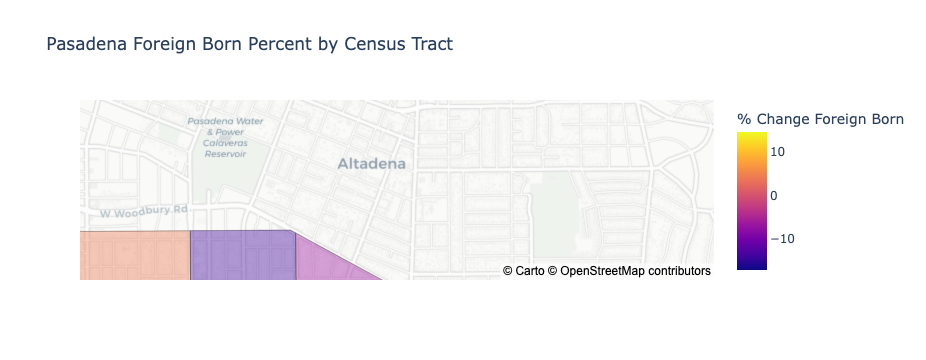

In [190]:
px.choropleth_mapbox(Pasadena,
                   geojson=Pasadena.geometry,
                   locations=Pasadena.index,
                   mapbox_style="carto-positron",
                   zoom=13,
                   opacity=0.4,
                   center = {"lat": center_lat_Pasadena, "lon": center_lon_Pasadena},
                   color="% Change Foreign Born",
                   hover_data=['% Europe', '% Asia', '% Latin America', '% Caribbean', '% Central America', '% Mexico', '% Other Central America', '% South America', '% Other Areas'],
                   title="Pasadena Foreign Born Percent by Census Tract")

Note the low percent foreign born population in west Pasadena. This area is west of our station area. To the north of our station area is where the highest population of foreign born residents live. It will be interesting to see how this map compares to our 2011 ACS data. 

### Chinatown: Foreign Born Interactive Map

Once again, we begin by creating a subset of only census tracts within our neighborhood. In this case, it is Chinatown. 

In [174]:
Chinatown = gdf[gdf["FIPS"].isin(['06037206010', 
                                       '06037207103', 
                                       '06037207102',
                                       '06037206020']
                                      )
                     ]

Chinatown is so small that it actually consists of one less census tract than our walkshed. The census tract with the low percentage of foreign born residents we discussed earlier is technically not in Chinatown. As a preview, check out the shape of Chinatown below. It  has all the census tracts entact from our walkshed except for the southern census tract. 

In [175]:
Chinatown.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,11 Caribbean,11 Caribbean Entered 2000 or later,11 Central America,11 Mexico,11 Mexico Entered 2000 or later,11 Other Central America,11 Other Central America 2000 or later,11 South America,11 South America Entered 2000 or later,11 Other areas,11 Other areas Entered 2000 or later,19 Total Population,19 Total Foreign Born,19 Total Entered 2010 or later,19 Europe,19 Europe Entered 2010 or later,19 Asia,19 Asia Entered 2010 or later,19 Latin America,19 Caribbean,19 Caribbean entered 2010 or later,19 Central America,19 Mexico,19 Mexico Entered 2010 or later,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,geometry,% Change Foreign Born,% Europe,% Asia,% Latin America,% Caribbean,% Central America,% Mexico,% Other Central America,% South America,% Other Areas
529,06037206010,"Census Tract 2060.10, Los Angeles, CA",2947.0,1661.0,18.0,0.0,926.0,290.0,714.0,11.0,0.0,703.0,635.0,29.0,68.0,0.0,0.0,0.0,3.0,3.0,4121.0,2059.0,238.0,10.0,0.0,1135.0,225.0,914.0,0.0,0.0,914.0,748.0,13.0,166.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",-6.398801,0.242660,27.541859,22.179083,0.000000,22.179083,18.150934,4.028149,0.000000,0.000000
530,06037206020,"Census Tract 2060.20, Los Angeles, CA",7677.0,1404.0,14.0,0.0,189.0,17.0,1187.0,55.0,24.0,1099.0,773.0,153.0,326.0,72.0,33.0,0.0,14.0,9.0,8947.0,1074.0,113.0,116.0,15.0,242.0,54.0,696.0,7.0,7.0,680.0,448.0,14.0,232.0,23.0,9.0,0.0,20.0,0.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378...",-6.284370,1.296524,2.704817,7.779144,0.078239,7.600313,5.007265,2.593048,0.100592,0.223539
537,06037207102,"Census Tract 2071.02, Los Angeles, CA",2276.0,1753.0,1.0,0.0,1592.0,799.0,160.0,38.0,0.0,102.0,72.0,0.0,30.0,0.0,20.0,0.0,0.0,0.0,2926.0,1837.0,114.0,50.0,29.0,1465.0,71.0,321.0,1.0,1.0,295.0,181.0,0.0,114.0,0.0,25.0,13.0,1.0,0.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",-14.239135,1.708817,50.068353,10.970608,0.034176,10.082023,6.185919,3.896104,0.854409,0.034176
538,06037207103,"Census Tract 2071.03, Los Angeles, CA",2098.0,1728.0,0.0,0.0,1688.0,626.0,22.0,0.0,0.0,22.0,22.0,0.0,0.0,0.0,0.0,0.0,18.0,18.0,2393.0,1649.0,411.0,16.0,11.0,1551.0,389.0,76.0,6.0,0.0,30.0,12.0,0.0,18.0,0.0,40.0,11.0,6.0,0.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",-13.454837,0.668617,64.814041,3.175930,0.250731,1.253656,0.501463,0.752194,1.671542,0.250731


<AxesSubplot:>

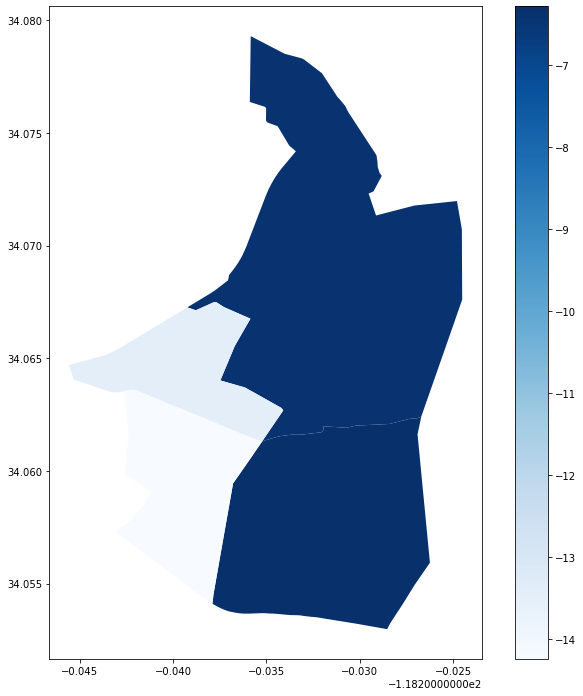

In [176]:
fig,ax = plt.subplots(figsize=(12,12))

Chinatown.plot(ax=ax,column='% Change Foreign Born', legend=True,cmap='Blues')

Now to add an interactive element. We are going to add hover text so that the percent foreign born of each census tract will pop up.

I'm adding a basemap under our interactive map to give geographic context of the Chinatown neighborhood. I'm bringing in my token below which allow me to access the MapBox library of basemaps. 

In [180]:
# what's the centroid?

minx, miny, maxx, maxy = Chinatown.geometry.total_bounds
center_lat_Chinatown = (maxy-miny)/2+miny
center_lon_Chinatown = (maxx-minx)/2+minx


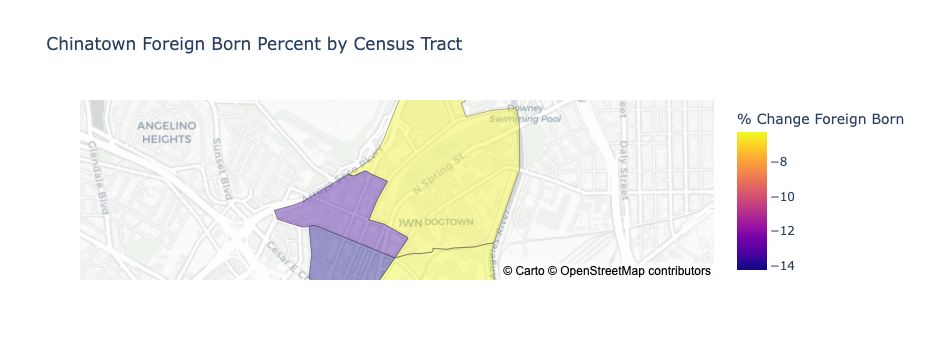

In [185]:
px.choropleth_mapbox(Chinatown,
                   geojson=Chinatown.geometry,
                   locations=Chinatown.index,
                   mapbox_style="carto-positron",
                   zoom=13,
                   opacity=0.4,
                   center = {"lat": center_lat_Chinatown, "lon": center_lon_Chinatown},
                   color="% Change Foreign Born",
                   hover_data=['% Europe', '% Asia', '% Latin America', '% Caribbean', '% Central America', '% Mexico', '% Other Central America', '% South America', '% Other Areas'],
                   title="Chinatown Foreign Born Percent by Census Tract")

This map allows us to read the exact percentage foreign born in each census tract by placing your cursor over it. It gives us more exact statistics than a static map. Considering our three Chinatown census tracts are at least 50% foreign born, it'll be interesting to see how these rates compare to the 2011 ACS survey. 

### Arroyo Seco Collective

Erik: Chinatown Station walkshed, isochrone mapping, interactive mapping, code proofreading

Kevin: Del Mar Station walk shed, plotly charting, final midterm notebook construction, code proofreading